In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import brightway2 as bw
import lca_algebraic as agb
from IPython.display import display
import database_explorer as dbex

In [3]:
bw.projects.current

'default'

# Ecoinvent 3.6

In [9]:
bw.projects.set_current('Ecoinvent 3.6')

In [10]:
#Setting brightway environment
bw.projects.set_current('Ecoinvent 3.6')
eidb = bw.Database('ecoinvent 3.6 cut-off')
biodb = bw.Database('biosphere3')

In [11]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser')
list_act.explore(strict = False, comments = False)

List of names:


{'basic slag fertiliser production',
 'catch crop growing, phacelia, September-October, organic fertiliser 40 kg N',
 'catch crop growing, phacelia, September-October, organic fertiliser 60 kg N',
 'catch crop growing, ryegrass, August-April, organic fertiliser 60 kg N, three cuts',
 'catch crop growing, ryegrass, August-April, organic fertiliser 80 kg N, three cuts',
 'catch crop growing, ryegrass, September-April, organic fertiliser 40 kg N, one cut',
 'catch crop growing, ryegrass, September-April, organic fertiliser 60 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, two cuts',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 60 kg N, two cuts',
 'catch crop growing, ryegrass-red&Egyptian clover-mixture, August-April, organic fertiliser 60 kg 

List of locations:


{'BR', 'CH', 'GLO', 'RER', 'RoW', 'US'}

List of units:


{'hectare', 'kilogram', 'unit'}

# Ecoinvent 3.8

In [20]:
bw.projects.set_current('Ecoinvent 3.8')

In [21]:
bw.databases

Databases dictionary with 3 object(s):
	biosphere3
	ecoinvent 3.8 cut-off
	pdb_bioenergy

In [22]:
#Setting brightway environment
bw.projects.set_current('Ecoinvent 3.8')
eidb = bw.Database('ecoinvent 3.8 cut-off')
biodb = bw.Database('biosphere3')

In [23]:
#Choix des catégories d'impacts
methods_EF = [m for m in bw.methods if 'EF v3.0 EN15804' in str(m) 
              and not 'no LT' in str(m) and not 'obsolete' in str(m) ]
methods_CC = [m for m in methods_EF if 'climate' in str(m)]
#Récupération des unités
EF_methods_unit = [bw.Method(m).metadata['unit'] for m in methods_EF]

In [24]:
#Search for bioenergy related datasets in eidb
[act for act in eidb if 'bio' in act['name'] 
 and not 'biogas' in act['name']
 and not 'biomethane' in act['name']
 and not 'biomass' in act['name']
 and not 'biowaste' in act['name']
 and not 'bioethanol' in act['name']
 and not 'biofuel' in act['name']]

['tap water production, conventional with biological treatment' (kilogram, RoW, None),
 'polyester-complexed starch biopolymer production' (kilogram, RoW, None),
 'polyester-complexed starch biopolymer production' (kilogram, RER, None),
 'tap water production, conventional with biological treatment' (kilogram, CA-QC, None),
 'tap water production, conventional with biological treatment' (kilogram, Europe without Switzerland, None),
 'tap water production, conventional with biological treatment' (kilogram, CO, None),
 'market for polyester-complexed starch biopolymer' (kilogram, GLO, None),
 'tap water production, conventional with biological treatment' (kilogram, CH, None)]

To explore :
- biogas,
- biomethane,
- biomass,
- biowaste,
- bioethanol,
- biofuels.

# Exploration of fertiliser dataset

In [10]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser')
list_act.explore(strict = False, comments = False)

List of names:


{'NPK (15-15-15) fertiliser production',
 'NPK (26-15-15) fertiliser production',
 'catch crop growing, phacelia, September-October, organic fertiliser 40 kg N',
 'catch crop growing, phacelia, September-October, organic fertiliser 60 kg N',
 'catch crop growing, ryegrass, August-April, organic fertiliser 60 kg N, three cuts',
 'catch crop growing, ryegrass, August-April, organic fertiliser 80 kg N, three cuts',
 'catch crop growing, ryegrass, September-April, organic fertiliser 40 kg N, one cut',
 'catch crop growing, ryegrass, September-April, organic fertiliser 60 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, two cuts',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 60 kg N, two cuts',
 'catch crop growing, ryegrass-red&Egyptian clover-mix

List of locations:


{'AL',
 'AR',
 'AT',
 'AU',
 'BA',
 'BD',
 'BE',
 'BG',
 'BR',
 'CA',
 'CH',
 'CI',
 'CL',
 'CN',
 'CO',
 'CR',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EC',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GLO',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IL',
 'IN',
 'IS',
 'IT',
 'KE',
 'LK',
 'LT',
 'LU',
 'LV',
 'MK',
 'MX',
 'MY',
 'NL',
 'NO',
 'NZ',
 'PE',
 'PH',
 'PL',
 'PT',
 'RER',
 'RNA',
 'RO',
 'RS',
 'RU',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'UA',
 'US',
 'VN',
 'XK',
 'ZA'}

List of units:


{'hectare', 'kilogram', 'unit'}

## Dataset per hectare

In [11]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'hectare')

list_act.explore(strict = False, 
                 comments = True)

['fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None),
 'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None),
 'planting with starter fertiliser, by no till planter' (hectare, BR, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None),
 'market for planting with starter fertiliser, by no till planter' (hectare, GLO, None),
 'planting with starter fertiliser, by no till planter' (hectare, RoW, None)]


List of names:


{'fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by rig fertiliser, sugarcane',
 'market for planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter'}

List of locations:


{'BR', 'GLO', 'RoW'}

List of units:


{'hectare'}

'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this



'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)


"This is delivering the service of 'fertilising, by rig fertiliser, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by rig fertiliser, sugarcane', in the Global geography



'planting with starter fertiliser, by no till planter' (hectare, BR, None)


'This dataset represents the operation of precision seeding. Seed is not included. The dataset covers the application of seeds and starter fertiliser in the field with a tractor of 250 hp and 10771 kg coupled to an implement that weighs 16000 kg. The functional unit (FU) is one ha seeded. The operation time is 0.21 h/FU and fuel consumption around 18 liters per hour.\n 40 m² are occupied inside the shed. The implement can be used to fertilising besides seeding. In this case, both activities are made in the same operation.\nImage: https://db3.ecoinvent.org/images/df354e48-72e9-4b57-beab-ad99f0af4c63\nGeography:  The inventory is modelled for agricultural processes in Brazil.\nTime period:  Time period of the most of the data collected for this dataset.'



'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in t



'market for planting with starter fertiliser, by no till planter' (hectare, GLO, None)


"This market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'planting with starter fertiliser, by no till planter', in the Global geography.\nThis is delivering the service of 'planting with starter fertiliser, by no till planter' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's m



'planting with starter fertiliser, by no till planter' (hectare, RoW, None)


'Bibliography is listed below and also the ilustration of the equipment.\nThis dataset represents the operation of precision seeding. Seed is not included. The dataset covers the application of seeds and starter fertiliser in the field with a tractor of 250 hp and 10771 kg coupled to an implement that weighs 16000 kg. The functional unit (FU) is one ha seeded. The operation time is 0.21 h/FU and fuel consumption around 18 liters per hour.\n 40 m² are occupied inside the shed. The implement can be used to fertilising besides seeding. In this case, both activities are made in the same operation.\nMATSUURA, M. I. S. F; PICOLI, J. F.; NOVAES, R. M. L.; DIAS, F. R. T.; HIRAKURI, M. H.; CASTRO, C.; ZORTEA, R. B. Workbook for life cycle inventories of agricultural products. Jaguariúna. Empresa Brasileira de Pesquisa Agropecuária, 2017.\nNemecek & Kagi  (2007) Life Cycle Inventories of Swiss and European Agricultural Production Systems. Final report ecoinvent v2.0 nº 15a. Agroscope Reckenholz 

fertilising, by rig fertiliser, sugarcane[RoW] (1.000000 hectare)  \
                                                                                                               input   
Ammonia                                                                                       Ammonia                  
Benzene                                                                                       Benzene                  
Benzo(a)pyrene                                                                         Benzo(a)pyrene                  
Cadmium                                                                                       Cadmium                  
Cadmium#1                                                                                     Cadmium                  
Carbon dioxide, fossil                                                         Carbon dioxide, fossil                  
Carbon monoxide, fossil                                                       Carbon monoxide, fossil                  
Chromium                                                                                     Chromium                  
Copper                                                                                         Copper                  
Dinitrogen monoxide                                                               Dinitrogen monoxide                  
Lead                                                                                             Lead                  
Methane, fossil                                                                       Methane, fossil                  
NMVOC, non-methane volatile organic compounds, ...  NMVOC, non-methane volatile organic compounds,...                  
Nickel                                                                                         Nickel                  
Nitrogen oxides                                                                       Nitrogen oxides                  
PAH, polycyclic aromatic hydrocarbons                           PAH, polycyclic aromatic hydrocarbons                  
Particulates, < 2.5 um                                                         Particulates, < 2.5 um                  
Selenium                                                                                     Selenium                  
Sulfur dioxide                                                                         Sulfur dioxide                  
Zinc                                                                                             Zinc                  
Zinc#1                                                                                           Zinc                  
agricultural machinery, unspecified                    market for agricultural machinery, unspecified                  
diesel                                                                          market for diesel[CO]                  
diesel#1                                                                        market for diesel[IN]                  
diesel#2                                                                        market for diesel[PE]                  
diesel#3                                                                        market for diesel[ZA]                  
diesel#4                                                                 market group for diesel[RER]                  
diesel#5                                                                       market for diesel[RoW]                  
fertilising, by rig fertiliser, sugarcane                                                         NaN                  
fertilising, by rig fertiliser, sugarcane#1                                                       NaN                  
planting with starter fertiliser, by no till pl...                                                NaN                  
planting with starter fertiliser, by no till pl...                                         

All flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
market for shed,0.002,NaN,0.001891,0.002,NaN,0.001891
"market for tractor, 4-wheel, agricultural",0.847518,NaN,0.38194,0.847518,NaN,0.38194
"market for agricultural machinery, unspecified",0.177083,NaN,2.26944,0.177083,NaN,2.26944
"fertilising, by rig fertiliser, sugarcane",1.0,1.0,NaN,1.0,NaN,NaN
market for diesel,9.204283,NaN,3.266809,10.941766,NaN,2.74806
market group for diesel,1.737483,NaN,NaN,NaN,NaN,0.518748
Zinc,0.001167,NaN,0.000229,0.001167,NaN,0.000229
Dinitrogen monoxide,0.00131,NaN,0.000392,0.00131,NaN,0.000392
Copper,0.000019,NaN,0.000006,0.000019,NaN,0.000006
Nickel,0.000001,NaN,0.0,0.000001,NaN,0.0


Technosphere flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
market for shed,0.002,NaN,0.001891,0.002,NaN,0.001891
"market for tractor, 4-wheel, agricultural",0.847518,NaN,0.38194,0.847518,NaN,0.38194
"market for agricultural machinery, unspecified",0.177083,NaN,2.26944,0.177083,NaN,2.26944
market for diesel,9.204283,NaN,3.266809,10.941766,NaN,2.74806
market group for diesel,1.737483,NaN,NaN,NaN,NaN,0.518748
"fertilising, by rig fertiliser, sugarcane",NaN,1.0,NaN,NaN,NaN,NaN
"planting with starter fertiliser, by no till planter",NaN,NaN,NaN,NaN,1.0,NaN


Biosphere flows:


,"fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","planting with starter fertiliser, by no till planter_BR","fertilising, by rig fertiliser, sugarcane_BR","market for planting with starter fertiliser, by no till planter_GLO","planting with starter fertiliser, by no till planter_RoW"
Zinc,0.001167,NaN,0.000229,0.001167,NaN,0.000229
Dinitrogen monoxide,0.00131,NaN,0.000392,0.00131,NaN,0.000392
Copper,0.000019,NaN,0.000006,0.000019,NaN,0.000006
Nickel,0.000001,NaN,0.0,0.000001,NaN,0.0
Nitrogen oxides,0.465,NaN,0.010851,0.465,NaN,0.010851
"PAH, polycyclic aromatic hydrocarbons",0.000036,NaN,0.000011,0.000036,NaN,0.000011
Cadmium,0.000043,NaN,0.000009,0.000043,NaN,0.000009
Sulfur dioxide,0.0111,NaN,0.003299,0.0111,NaN,0.003299
Lead,0.000188,NaN,0.000037,0.000188,NaN,0.000037
"Carbon monoxide, fossil",0.0591,NaN,0.002042,0.0591,NaN,0.002042


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"fertilising, by rig fertiliser, sugarcane[RoW]",48.177776,-0.233814,48.391428,0.020162
"market for fertilising, by rig fertiliser, sugarcane",48.091466,-0.233417,48.303810,0.021073
"planting with starter fertiliser, by no till planter[BR]",27.453172,-0.227925,27.633318,0.047778
"fertilising, by rig fertiliser, sugarcane[BR]",47.192233,-0.229288,47.390957,0.030564
"market for planting with starter fertiliser, by no till planter",27.742285,-0.229253,27.926811,0.044727
"planting with starter fertiliser, by no till planter[RoW]",27.747419,-0.229276,27.932022,0.044673


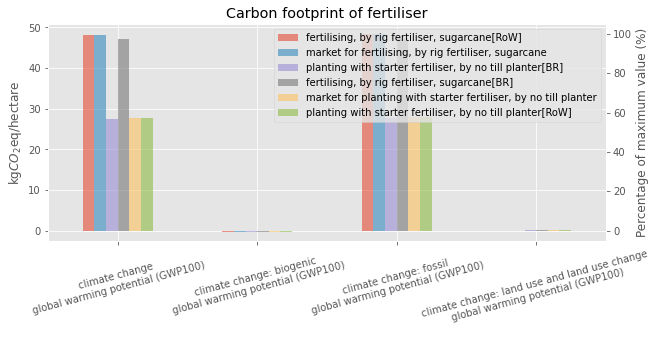

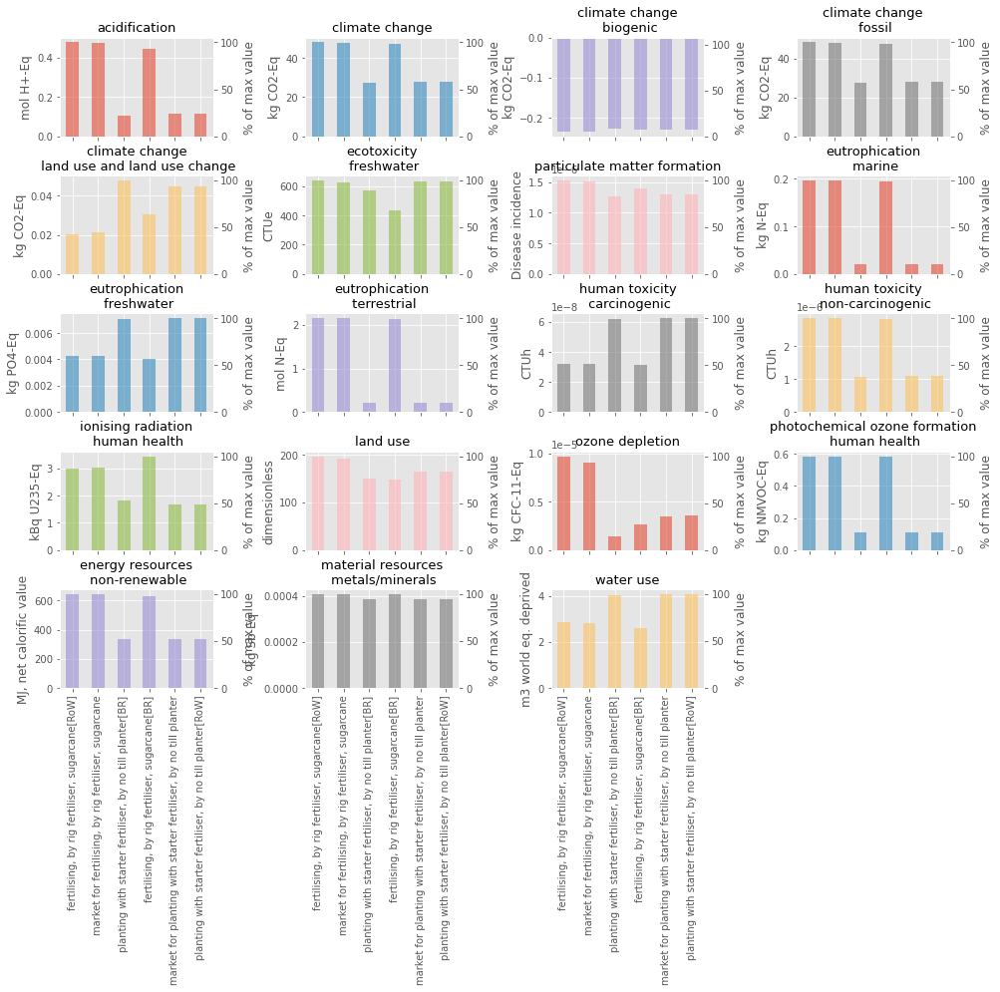

In [12]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


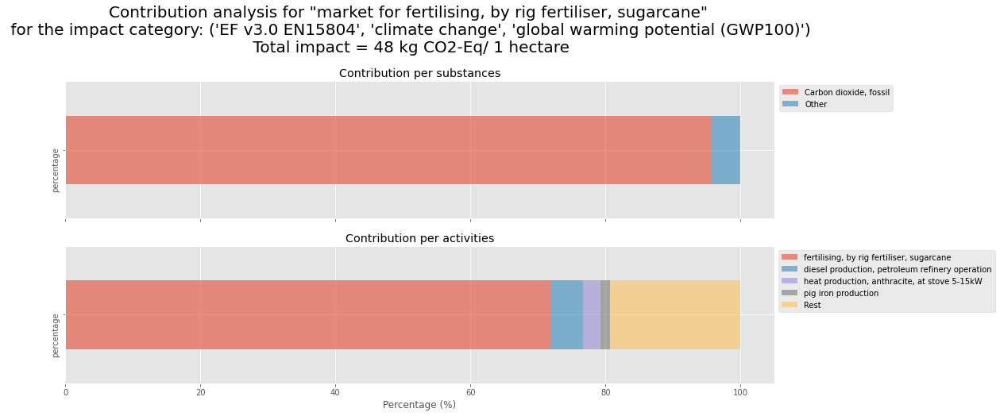

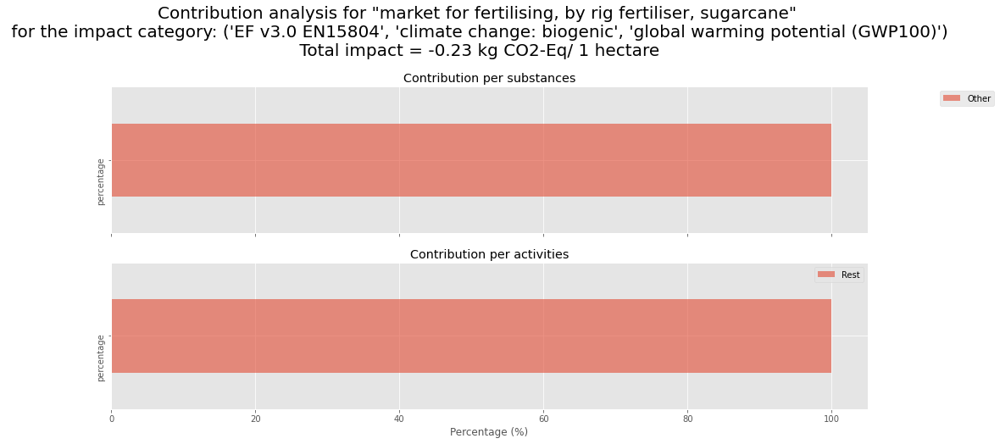

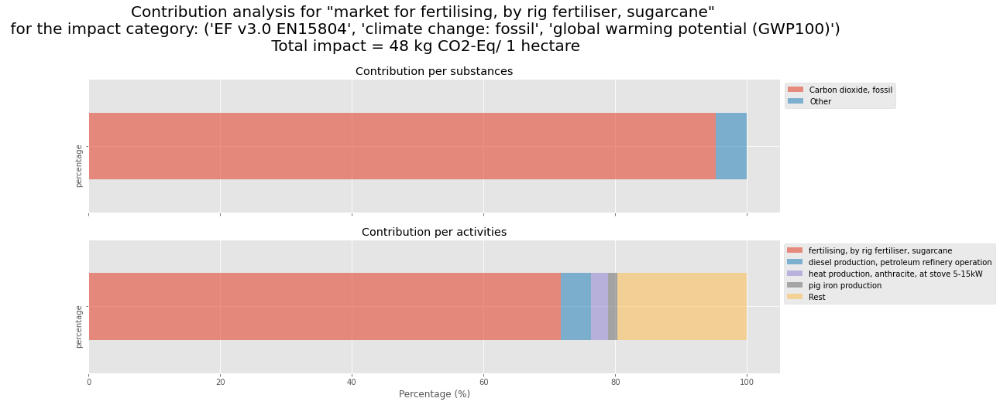

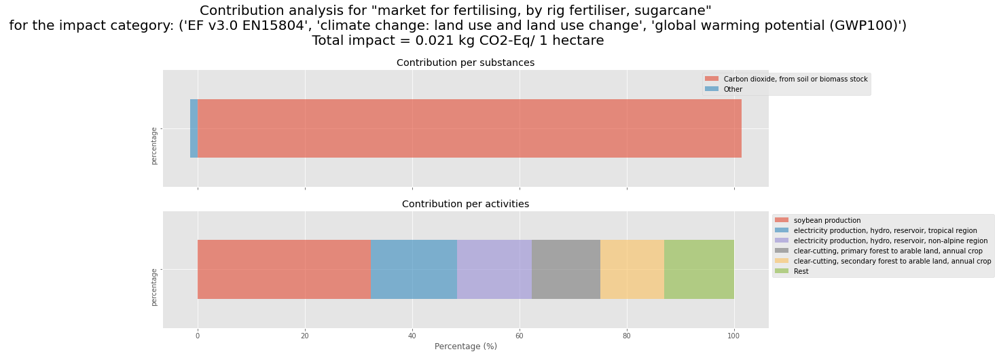

In [13]:
list_act.contribution_analysis(i = 1,
                               methods = methods_CC,
                               save = True) 

'planting with starter fertiliser, by no till planter' (hectare, BR, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


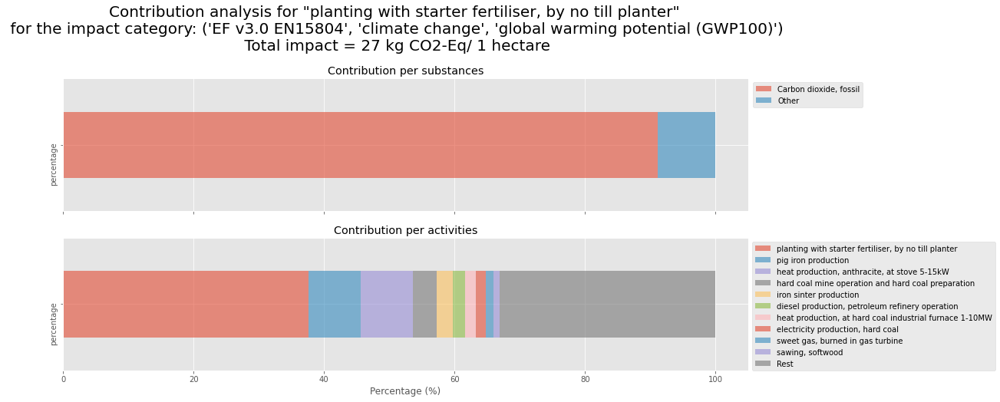

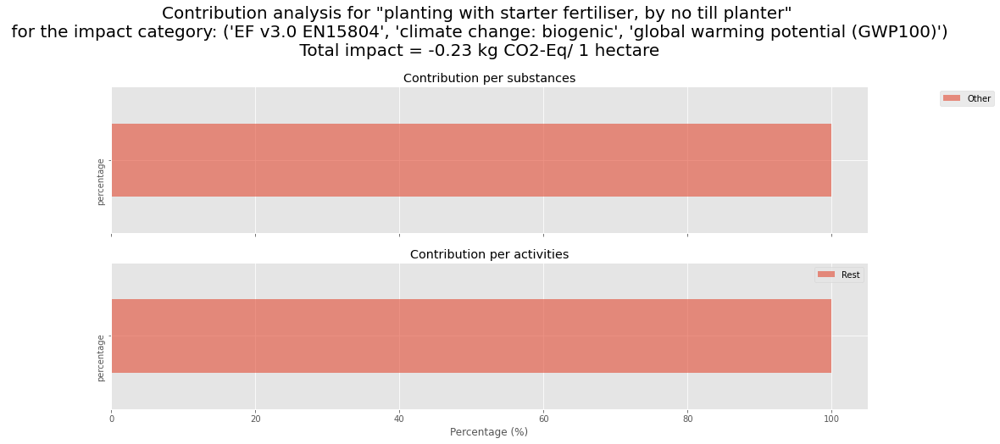

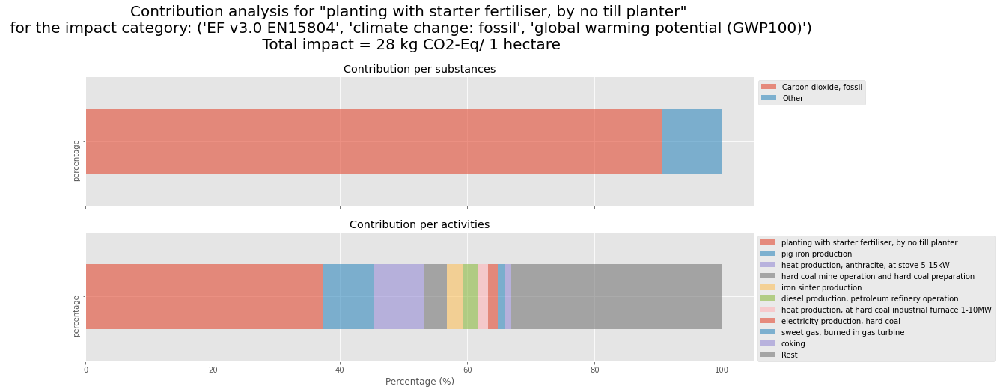

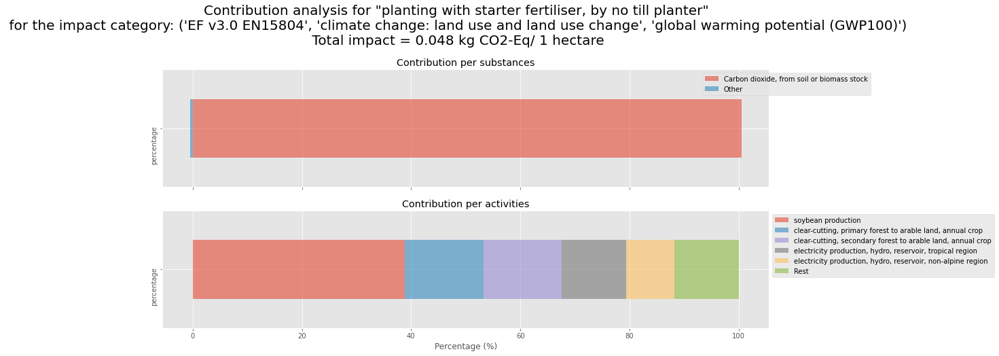

In [14]:
list_act.contribution_analysis(i = 2,
                               methods = methods_CC,
                               save = True) 

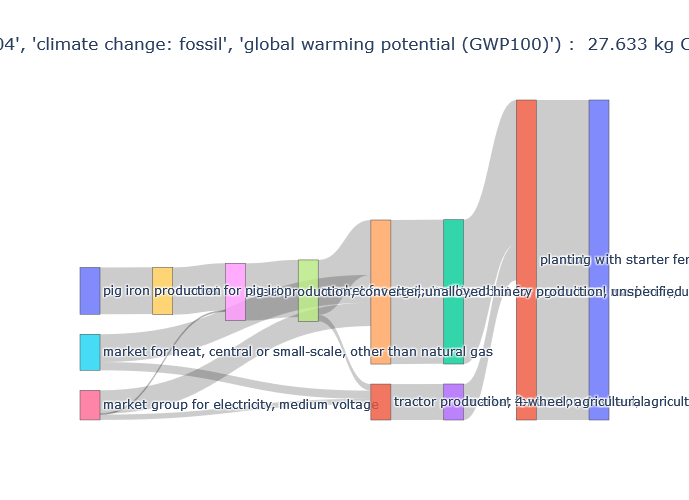

In [15]:
list_act.plot_sankey(i = 2, method = methods_CC[2], cutoff = 0.1)

,label,location,parent,value,value_pct
0,"market for fertilising, by rig fertiliser, sug...",GLO,,48.303810,100.000000
1,"fertilising, by rig fertiliser, sugarcane",BR,"market for fertilising, by rig fertiliser, sug...",4.150265,8.592004
2,"fertilising, by rig fertiliser, sugarcane",RoW,"market for fertilising, by rig fertiliser, sug...",44.153545,91.407996
3,"market for tractor, 4-wheel, agricultural",GLO,"fertilising, by rig fertiliser, sugarcane",6.295316,13.032753
4,market for diesel,RoW,"fertilising, by rig fertiliser, sugarcane",3.722541,7.706517
5,"tractor production, 4-wheel, agricultural",RoW,"market for tractor, 4-wheel, agricultural",6.887792,14.259314
6,"diesel production, petroleum refinery operation",RoW,"fertilising, by rig fertiliser, sugarcane",0.604229,1.250893
7,market for petroleum,GLO,market for diesel,3.572318,7.395521


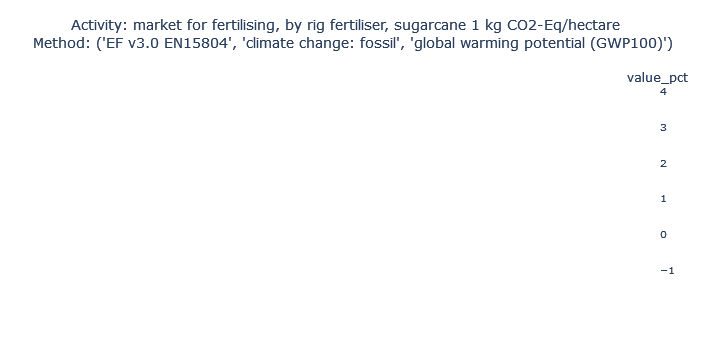

In [16]:
list_act.plot_sunburst(i = 1, method = methods_CC[2], cutoff = 0.05)

Impact of fertilising operation (but without the fertiliser)

## Dataset fertilising

In [ ]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertilising',
                         unit = 'hectare')

list_act.explore(strict = False, 
                 comments = True)

['fertilising, by stool splitter, sugarcane' (hectare, BR, None),
 'fertilising, by broadcaster' (hectare, ZA, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None),
 'fertilising, by broadcaster' (hectare, RoW, None),
 'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None),
 'fertilising, by stool splitter, sugarcane' (hectare, RoW, None),
 'market for fertilising, by broadcaster' (hectare, GLO, None),
 'fertilising, by broadcaster' (hectare, Canada without Quebec, None),
 'fertilising, by broadcaster' (hectare, CH, None),
 'fertilising, by broadcaster' (hectare, BR, None),
 'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None),
 'market for fertilising, by stool splitter, sugarcane' (hectare, GLO, None),
 'fertilising, by broadcaster' (hectare, CA-QC, None)]


List of names:


{'fertilising, by broadcaster',
 'fertilising, by rig fertiliser, sugarcane',
 'fertilising, by stool splitter, sugarcane',
 'market for fertilising, by broadcaster',
 'market for fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by stool splitter, sugarcane'}

List of locations:


{'BR', 'CA-QC', 'CH', 'Canada without Quebec', 'GLO', 'RoW', 'ZA'}

List of units:


{'hectare'}

'fertilising, by stool splitter, sugarcane' (hectare, BR, None)


"This dataset represents the boiler ashes application operation  in one hectare (ha). The application is done in the furrow by a stool splitter aiming soil fertilization. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about 2.8 hours per ha (37.5% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 90 hp; weight 3410 kg) plus  a stool splitter implement (weight 280 kg).  Life spam of this tractor is considered as 13650 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in



'fertilising, by broadcaster' (hectare, ZA, None)


'Trailed fertiliser broadcaster (pulled by tractor), 500l carrying capacity, fertiliser not included. FU is one ha fertilised..  \n\nChild dataset exchanges scaled from GLO parent dataset based on diesel consumption in South Africa. Created to proxy farm machinery/fieldwork representative of the South African context. Data quality indicators adjusted accordingly. Sulphur dioxide emissions adapted to be representative of South African diesel composition, typically 500ppm sulphur. Other difference with the parent dataset is the production volume, which now represents the production volume in South Africa.\n\nWarning: If the parent value for diesel consumption (in the GLO parent dataset) is changed in future edition, the user must change the parameter "ecoinvent diesel consumption" accordingly in order to get the right ratio of ZA/ecoinvent diesel consumption.\nGeography:  The inventories are based on measurements made by the FAT, in Switzerland.\nTechnology:  Current state of the art in 



'fertilising, by rig fertiliser, sugarcane' (hectare, BR, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The dataset is modeled for sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this activity were collected in t



'fertilising, by broadcaster' (hectare, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nFertiliser broadcaster, 500l carrying capacity, fer



'market for fertilising, by rig fertiliser, sugarcane' (hectare, GLO, None)


"This is delivering the service of 'fertilising, by rig fertiliser, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by rig fertiliser, sugarcane', in the Global geography



'fertilising, by stool splitter, sugarcane' (hectare, RoW, None)


"This dataset represents the boiler ashes application operation  in one hectare (ha). The application is done in the furrow by a stool splitter aiming soil fertilization. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about 2.8 hours per ha (37.5% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 90 hp; weight 3410 kg) plus  a stool splitter implement (weight 280 kg).  Life spam of this tractor is considered as 13650 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling th



'market for fertilising, by broadcaster' (hectare, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'fertilising, by broadcaster', in the Global geography.\nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is delivering the service of 'fertilising, by broadcaster' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this 



'fertilising, by broadcaster' (hectare, Canada without Quebec, None)


'Fertiliser broadcaster, 500l carrying capacity, fertiliser not included. FU is one ha fertilised.\nDataset exchanges scaled from GLO dataset based on diesel consumption in Canada. Created to proxy farm machinery/fieldwork representative of the Canadian context.\nTechnology:  Emissions and fuel consumption by the newest models of tractors set into operation during the period from 1999 to 2001.\nTime period:  Measurements were made in the last few years (1999-2001). Diesel consumption data refer to year of 2019.'



'fertilising, by broadcaster' (hectare, CH, None)


"This dataset represents an example of a typical fertilizing process. Fertiliser broadcaster, 500l carrying capacity. Fertiliser is not included. The functional unit (FU) is one ha fertilized. The operation time is 1.5 h/FU.\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports



'fertilising, by broadcaster' (hectare, BR, None)


'This dataset represents the fertilising service. The dataset covers the application of fertiliser with a tractor (120 hp) coupled to an broadcaster (10 t carrying capacity). Functional Unit (FU) is one hectare fertilised.The operation time is 0.07 h/FU and the fuel consumption is 12 liters per hour.\nThis is a common operation in grain production in Brazil.\nImage: https://db3.ecoinvent.org/images/4a77d441-c40d-4bd1-baf7-41ba2cea8ca2\nGeography:  The inventory is modelled for agricultural processes in Brazil.\nTechnology:  Fuel consumption has been extrapolated to Brazil, but emissions per kg diesel and others inputs were taken from the original values.\nTime period:  Most of the data used to modelling this activity were collected in the last few years (2012-2016).'



'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)


"This dataset represents the fertilising operation in one hectare (ha). This operation is related to one hectare of the cultural treatments used for the sugarcane culture. Functional Unit (FU) is one hectare of fertiliser application. The operation time is about  2.08  hours per ha (50% of this time is actually worked, discounting time for maintenance, waiting in the field and re-allocations between the plots).\nGeography:  The global dataset is modeled based on information from sugarcane production system in Brazilian South-Cental region.\nTechnology:  This activity is performed with a tractor (power 125 hp; weight 4780 kg) plus a fertilizer broadcaster (weight 850 kg). Life spam of the tractor is considered as 11750 operating hours and of the implement as 10000 operating hours. Machinery used, fuel consumption and operation efficiencies were based on data from sugarcane mills in Brazil, expert's informations and unpublished data.\nTime period:  Most of the data used to modelling this



'market for fertilising, by stool splitter, sugarcane' (hectare, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is delivering the service of 'fertilising, by stool splitter, sugarcane' on an area of one hectare. It includes the use of diesel powered mobile infrastructure (tractors, machinery). Diesel combustion linearly affects direct emissions. Hence, a user can model the right amount of this service by using information on diesel consumption. For example: If within the user's model diesel consumption is 30 kg/ha while in this service it is 15 kg/ha, the user can model with 2 ha of this service.\nThis is the market for  'fertilising, by stool splitter, sugarcane', in the Global geography



'fertilising, by broadcaster' (hectare, CA-QC, None)


'This dataset represents the service of mineral fertilizing 1 ha of field with a broadcaster of solid fertilizer (4 t carrying capacity) or a liquid nitrogen applicator (3800 L carrying capacity). Fertilizer is not included, nor field emissions from fertilizer application.\nDiesel consumption is calculated from primary data and models from the American Society of Agricultural and Biological Engineers (ASABE) published in 2006 and might be representative of more recent technology than the GLO parent dataset.\nChild dataset exchanges scaled from GLO parent dataset based on diesel consumption in Quebec. Created to proxy farm machinery/fieldwork representative of the Quebec context. Data quality indicators adjusted accordingly. Other difference with the parent dataset is the production volume, which now represents the production volume in Quebec.\nWarning: If the parent value for diesel consumption (in the GLO parent dataset) is changed in future edition, the user must change the parameter

fertilising, by stool splitter, sugarcane[BR] (1.000000 hectare)  \
                                                                                                              input   
Ammonia                                                                                       Ammonia                 
Benzene                                                                                       Benzene                 
Benzo(a)pyrene                                                                         Benzo(a)pyrene                 
Cadmium                                                                                       Cadmium                 
Cadmium#1                                                                                     Cadmium                 
Carbon dioxide, fossil                                                         Carbon dioxide, fossil                 
Carbon monoxide, fossil                                                       Carbon monoxide, fossil                 
Chromium                                                                                     Chromium                 
Copper                                                                                         Copper                 
Dinitrogen monoxide                                                               Dinitrogen monoxide                 
Lead                                                                                             Lead                 
Methane, fossil                                                                       Methane, fossil                 
NMVOC, non-methane volatile organic compounds, ...  NMVOC, non-methane volatile organic compounds,...                 
Nickel                                                                                         Nickel                 
Nitrogen oxides                                                                       Nitrogen oxides                 
PAH, polycyclic aromatic hydrocarbons                           PAH, polycyclic aromatic hydrocarbons                 
Particulates, < 2.5 um                                                         Particulates, < 2.5 um                 
Selenium                                                                                     Selenium                 
Sulfur dioxide                                                                         Sulfur dioxide                 
Zinc                                                                                             Zinc                 
Zinc#1                                                                                           Zinc                 
agricultural machinery, unspecified                    market for agricultural machinery, unspecified                 
diesel                                                                          market for diesel[BR]                 
diesel#1                                                                                          NaN                 
diesel#2                                                                                          NaN                 
diesel#3                                                                                          NaN                 
diesel#4                                                                                          NaN                 
diesel#5                                                                                          NaN                 
fertilising, by broadcaster                                                                       NaN                 
fertilising, by broadcaster#1                                                                     NaN                 
fertilising, by broadcaster#2                                                                     NaN                 
fertilising, by broadcaster#3                                                                     NaN                 
ferti

All flows:


,"fertilising, by stool splitter, sugarcane_BR","fertilising, by broadcaster_ZA","fertilising, by rig fertiliser, sugarcane_BR","fertilising, by broadcaster_RoW","market for fertilising, by rig fertiliser, sugarcane_GLO","fertilising, by stool splitter, sugarcane_RoW","market for fertilising, by broadcaster_GLO","fertilising, by broadcaster_Canada without Quebec","fertilising, by broadcaster_CH","fertilising, by broadcaster_BR","fertilising, by rig fertiliser, sugarcane_RoW","market for fertilising, by stool splitter, sugarcane_GLO","fertilising, by broadcaster_CA-QC"
market for shed,0.002,0.00171,0.002,0.00171,NaN,0.002,NaN,0.00171,NaN,0.00171,0.002,NaN,0.00171
"market for agricultural machinery, unspecified",0.078431,0.241,0.177083,0.241,NaN,0.078431,NaN,0.241,0.241,0.241,0.177083,NaN,0.241
market for diesel,12.117665,2.5,10.941766,5.29,NaN,10.193457,NaN,2.676349,5.29,0.7,9.204283,NaN,2.5
"fertilising, by stool splitter, sugarcane",1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
"market for tractor, 4-wheel, agricultural",0.699767,0.687,0.847518,0.687,NaN,0.699767,NaN,0.687,0.687,0.687,0.847518,NaN,0.687
Benzo(a)pyrene,0.000088,0.0,0.0,0.0,NaN,0.000088,NaN,0.0,0.0,0.0,0.0,NaN,0.0
Benzene,0.000088,0.000018,0.00008,0.000039,NaN,0.000088,NaN,0.00002,0.000039,0.000005,0.00008,NaN,0.000018
Zinc,0.001031,0.0009,0.001167,0.000902,NaN,0.001031,NaN,0.0009,0.000902,0.000898,0.001167,NaN,0.0009
Dinitrogen monoxide,0.00145,0.0003,0.00131,0.000635,NaN,0.00145,NaN,0.000321,0.000635,0.000084,0.00131,NaN,0.0003
Cadmium,0.000038,0.0,0.000043,0.0,NaN,0.000038,NaN,0.0,0.0,0.0,0.000043,NaN,0.0


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"fertilising, by stool splitter, sugarcane[BR]",49.681613,-0.228965,49.882872,0.027705
"fertilising, by broadcaster[ZA]",16.269326,-0.207361,16.459771,0.016916
"fertilising, by rig fertiliser, sugarcane[BR]",47.192233,-0.229288,47.390957,0.030564
"fertilising, by broadcaster[RoW]",26.516799,-0.203705,26.703151,0.017353
"market for fertilising, by rig fertiliser, sugarcane",48.091466,-0.233417,48.303810,0.021073
"fertilising, by stool splitter, sugarcane[RoW]",50.773072,-0.233977,50.990864,0.016185
"market for fertilising, by broadcaster",26.126619,-0.203821,26.313101,0.017339
"fertilising, by broadcaster[Canada without Quebec]",16.890495,-0.207065,17.080617,0.016943
"fertilising, by broadcaster[CH]",25.887252,-0.069860,25.940084,0.017029
"fertilising, by broadcaster[BR]",9.588527,-0.208711,9.779956,0.017282


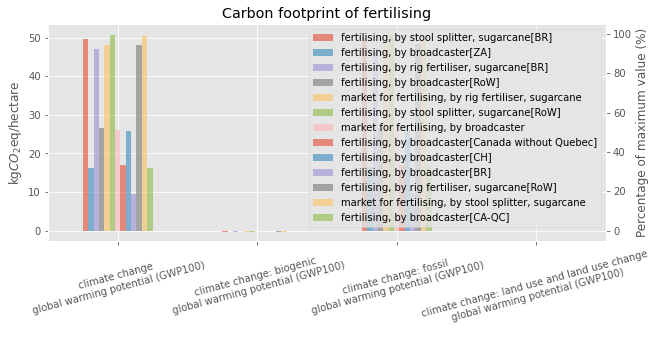

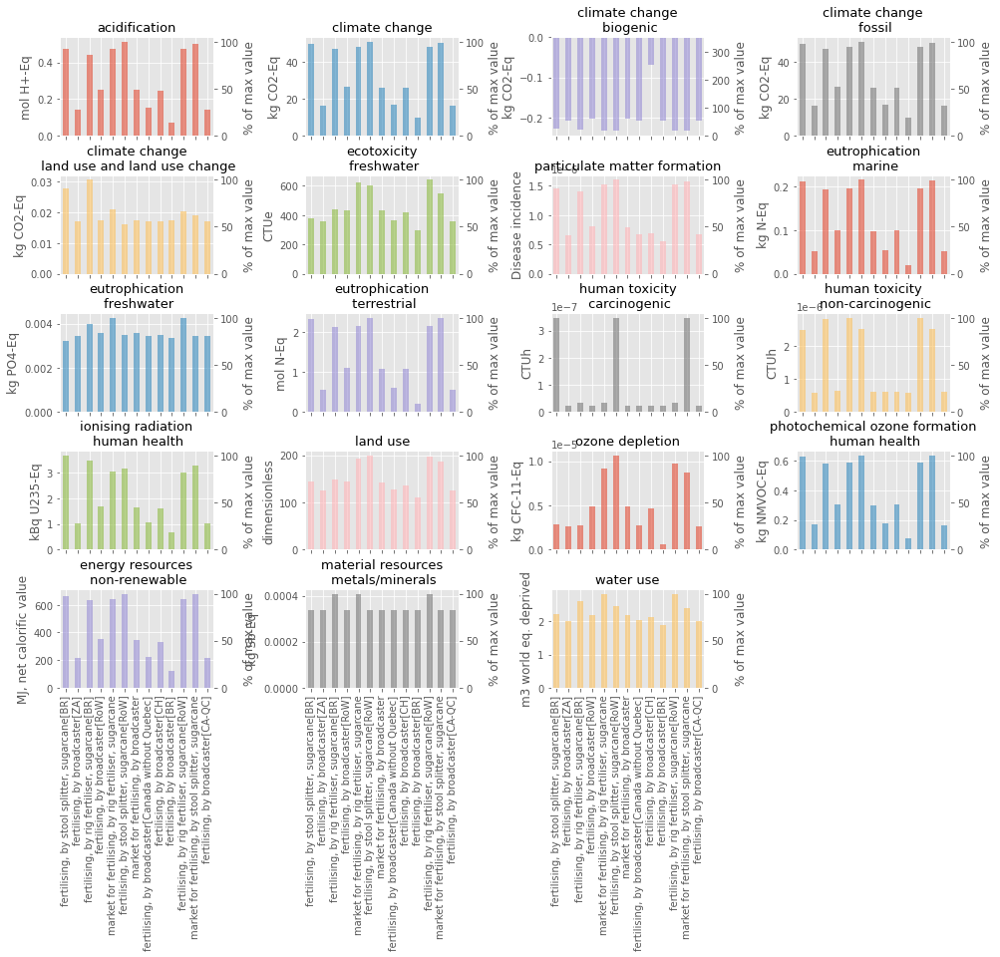

In [152]:
list_act.analyse(methods_CC, methods_EF, print_mode = 2)

## Dataset per unit

In [18]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'unit')

list_act.explore(strict = False, 
                 comments = True)

['phosphoric acid factory construction, fertiliser grade' (unit, RoW, None),
 'phosphoric acid factory construction, fertiliser grade' (unit, US, None),
 'market for phosphoric acid factory, fertiliser grade' (unit, GLO, None)]


List of names:


{'market for phosphoric acid factory, fertiliser grade',
 'phosphoric acid factory construction, fertiliser grade'}

List of locations:


{'GLO', 'RoW', 'US'}

List of units:


{'unit'}

'phosphoric acid factory construction, fertiliser grade' (unit, RoW, None)


"Large uncertainties for equipment used due to weak data from a small pilot plant. Process refers to an phosphoric acid plant using with 65'000 t phosphoric acid (as 100% H3PO4) production per year. Assumed life time 50 years.\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent repor



'phosphoric acid factory construction, fertiliser grade' (unit, US, None)


"[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nLarge uncertainties for equipment used due to weak 



'market for phosphoric acid factory, fertiliser grade' (unit, GLO, None)


"This is a market activity. In the case of services or immobile infrastructures, markets are connecting suppliers and consumers at a global level. For specific connections at regional level, direct links between the local producing activities and the local consumers are preferred. Transport or losses are logically not relevant for this type of products.\nThis is an immobile infrastructure, representing the construction of phosphoric acid factory, fertiliser grade. The infrastructure is based on average data from a small pilot plant. The yearly output is 65,000 tons phosphoric acid (as 100% H3PO4) to be used as fertilizer and its life time is assumed to be 50 years. The process includes building materials, material for processing equipment, use and occupation for plant, as well as dismanteling  and decommission of plant. \nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is the market for  'phosphoric acid factory, fertiliser grade', i

Correspond to the fertiliser factories.

## Dataset per kilogram

In [20]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = False)

List of names:


{'NPK (15-15-15) fertiliser production',
 'NPK (26-15-15) fertiliser production',
 'catch crop growing, phacelia, September-October, organic fertiliser 40 kg N',
 'catch crop growing, phacelia, September-October, organic fertiliser 60 kg N',
 'catch crop growing, ryegrass, August-April, organic fertiliser 60 kg N, three cuts',
 'catch crop growing, ryegrass, August-April, organic fertiliser 80 kg N, three cuts',
 'catch crop growing, ryegrass, September-April, organic fertiliser 40 kg N, one cut',
 'catch crop growing, ryegrass, September-April, organic fertiliser 60 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, one cut',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 30 kg N, two cuts',
 'catch crop growing, ryegrass-Egyptian&Persian clover-mixture, August-October, organic fertiliser 60 kg N, two cuts',
 'catch crop growing, ryegrass-red&Egyptian clover-mix

List of locations:


{'AL',
 'AR',
 'AT',
 'AU',
 'BA',
 'BD',
 'BE',
 'BG',
 'BR',
 'CA',
 'CH',
 'CI',
 'CL',
 'CN',
 'CO',
 'CR',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EC',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GLO',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IL',
 'IN',
 'IS',
 'IT',
 'KE',
 'LK',
 'LT',
 'LU',
 'LV',
 'MK',
 'MX',
 'MY',
 'NL',
 'NO',
 'NZ',
 'PE',
 'PH',
 'PL',
 'PT',
 'RER',
 'RNA',
 'RO',
 'RS',
 'RU',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'UA',
 'US',
 'VN',
 'XK',
 'ZA'}

List of units:


{'kilogram'}

In [21]:
list_name = ['market for NPK (15-15-15) fertiliser',
 'market for NPK (26-15-15) fertiliser',
 'market for inorganic nitrogen fertiliser, as N',
 'market for inorganic phosphorus fertiliser, as P2O5',
 'market for inorganic potassium fertiliser, as K2O',
 'market for organic nitrogen fertiliser, as N',
 'market for organic phosphorus fertiliser, as P2O5',
 'market for organic potassium fertiliser, as K2O',
 'market for organo-mineral nitrogen fertiliser, as N',
 'market for organo-mineral phosphorus fertiliser, as P2O5',
 'market for organo-mineral potassium fertiliser, as K2O']

In [49]:
list_act_input = [act for act in eidb if act['name'] in list_name
            and act['location'] in ['GLO', 'RoW']]
list_act_input

['market for NPK (15-15-15) fertiliser' (kilogram, RoW, None),
 'market for organic nitrogen fertiliser, as N' (kilogram, GLO, None),
 'market for organo-mineral nitrogen fertiliser, as N' (kilogram, GLO, None),
 'market for organic phosphorus fertiliser, as P2O5' (kilogram, GLO, None),
 'market for inorganic nitrogen fertiliser, as N' (kilogram, RoW, None),
 'market for organo-mineral phosphorus fertiliser, as P2O5' (kilogram, GLO, None),
 'market for organic potassium fertiliser, as K2O' (kilogram, GLO, None),
 'market for organo-mineral potassium fertiliser, as K2O' (kilogram, GLO, None),
 'market for inorganic phosphorus fertiliser, as P2O5' (kilogram, RoW, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, RoW, None),
 'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)]

In [51]:
len(list_act_input)

11

In [52]:
list_act = dbex.list_act(database = eidb,
                         name = 'fertiliser',
                         list_act_input = list_act_input,
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = False)

List of names:


{'market for NPK (15-15-15) fertiliser',
 'market for NPK (26-15-15) fertiliser',
 'market for inorganic nitrogen fertiliser, as N',
 'market for inorganic phosphorus fertiliser, as P2O5',
 'market for inorganic potassium fertiliser, as K2O',
 'market for organic nitrogen fertiliser, as N',
 'market for organic phosphorus fertiliser, as P2O5',
 'market for organic potassium fertiliser, as K2O',
 'market for organo-mineral nitrogen fertiliser, as N',
 'market for organo-mineral phosphorus fertiliser, as P2O5',
 'market for organo-mineral potassium fertiliser, as K2O'}

List of locations:


{'GLO', 'RoW'}

List of units:


{'kilogram'}

market for NPK (15-15-15) fertiliser[RoW] (1.000000 kilogram)  \
                                                                                                    input   
NPK (15-15-15) fertiliser                            NPK (15-15-15) fertiliser production[RoW]              
NPK (26-15-15) fertiliser                                                                  NaN              
inorganic nitrogen fertiliser, as N                                                        NaN              
inorganic nitrogen fertiliser, as N#1                                                      NaN              
inorganic nitrogen fertiliser, as N#10                                                     NaN              
...                                                                                        ...              
transport, freight train#1                             market for transport, freight train[ZA]              
transport, freight train#2                            market for transport, freight train[RoW]              
transport, freight, inland waterways, barge  market for transport, freight, inland waterway...              
transport, freight, lorry, unspecified       market for transport, freight, lorry, unspecif...              
transport, freight, sea, container ship      market for transport, freight, sea, container ...              

                                                                      \
                                               amount           unit   
NPK (15-15-15) fertiliser                         1.0       kilogram   
NPK (26-15-15) fertiliser                         NaN            NaN   
inorganic nitrogen fertiliser, as N               NaN            NaN   
inorganic nitrogen fertiliser, as N#1             NaN            NaN   
inorganic nitrogen fertiliser, as N#10            NaN            NaN   
...                                               ...            ...   
transport, freight train#1                   0.011213  ton kilometer   
transport, freight train#2                   0.220505  ton kilometer   
transport, freight, inland waterways, barge     0.047  ton kilometer   
transport, freight, lorry, unspecified          0.148  ton kilometer   
transport, freight, sea, container ship         0.841  ton kilometer   

                                            market for organic nitrogen fertiliser, as N (1.000000 kilogram)  \
                                                                                                       input   
NPK (15-15-15) fertiliser                                                                  NaN                 
NPK (26-15-15) fertiliser                                                                  NaN                 
inorganic nitrogen fertiliser, as N                                                        NaN                 
inorganic nitrogen fertiliser, as N#1                                                      NaN                 
inorganic nitrogen fertiliser, as N#10                                                     NaN                 
...                                                                                        ...                 
transport, freight train#1                                                                 NaN                 
transport, freight train#2                                                                 NaN                 
transport, freight, inland waterways, barge                                                NaN                 
transport, freight, lorry, unspecified                                                     NaN                 
transport, freight, sea, container ship                                                    NaN                 

                                                         \
                                            amount unit   
NPK (15-15-15) fertiliser                      NaN  NaN   
NPK (26-15-15) fertiliser                      NaN  NaN

All flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW
"market for transport, freight, inland waterways, barge",0.047,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047
"market for transport, freight, sea, container ship",0.841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.841
market for NPK (15-15-15) fertiliser,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight, lorry, unspecified",0.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.148
NPK (15-15-15) fertiliser production,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight train",0.276,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.276
"market for organic nitrogen fertiliser, as N",NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"nutrient supply from ash, from combustion of straw",NaN,0.000006,NaN,0.000166,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from coconut husk,NaN,0.013614,NaN,0.099962,NaN,NaN,0.00059,NaN,NaN,NaN,NaN
nutrient supply from compost,NaN,0.514596,NaN,0.359862,NaN,NaN,0.286911,NaN,NaN,NaN,NaN


Technosphere flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW
"market for transport, freight, inland waterways, barge",0.047,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047
"market for transport, freight, sea, container ship",0.841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.841
"market for transport, freight, lorry, unspecified",0.148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.148
NPK (15-15-15) fertiliser production,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, freight train",0.276,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.276
"nutrient supply from ash, from combustion of straw",NaN,0.000006,NaN,0.000166,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from coconut husk,NaN,0.013614,NaN,0.099962,NaN,NaN,0.00059,NaN,NaN,NaN,NaN
nutrient supply from compost,NaN,0.514596,NaN,0.359862,NaN,NaN,0.286911,NaN,NaN,NaN,NaN
nutrient supply from fermentation filtrate,NaN,0.000001,NaN,0.000001,NaN,NaN,0.0,NaN,NaN,NaN,NaN
"nutrient supply from filter cake, from sugarcane juice filtration",NaN,0.000114,NaN,0.000193,NaN,NaN,0.000021,NaN,NaN,NaN,NaN


Biosphere flows:


,market for NPK (15-15-15) fertiliser_RoW,"market for organic nitrogen fertiliser, as N_GLO","market for organo-mineral nitrogen fertiliser, as N_GLO","market for organic phosphorus fertiliser, as P2O5_GLO","market for inorganic nitrogen fertiliser, as N_RoW","market for organo-mineral phosphorus fertiliser, as P2O5_GLO","market for organic potassium fertiliser, as K2O_GLO","market for organo-mineral potassium fertiliser, as K2O_GLO","market for inorganic phosphorus fertiliser, as P2O5_RoW","market for inorganic potassium fertiliser, as K2O_RoW",market for NPK (26-15-15) fertiliser_RoW


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
market for NPK (15-15-15) fertiliser[RoW],1.431558,0.003250,1.425950,0.002358
"market for organic nitrogen fertiliser, as N",0.619176,0.001769,0.615597,0.001810
"market for organo-mineral nitrogen fertiliser, as N",0.000000,0.000000,0.000000,0.000000
"market for organic phosphorus fertiliser, as P2O5",0.286690,0.000816,0.285005,0.000869
"market for inorganic nitrogen fertiliser, as N[RoW]",6.175133,0.015866,6.149593,0.009674
"market for organo-mineral phosphorus fertiliser, as P2O5",0.000000,0.000000,0.000000,0.000000
"market for organic potassium fertiliser, as K2O",0.186990,0.000513,0.185580,0.000897
"market for organo-mineral potassium fertiliser, as K2O",0.000450,0.000001,0.000446,0.000003
"market for inorganic phosphorus fertiliser, as P2O5[RoW]",2.886360,0.005210,2.871285,0.009865
"market for inorganic potassium fertiliser, as K2O[RoW]",3.463277,0.006080,3.451344,0.005853


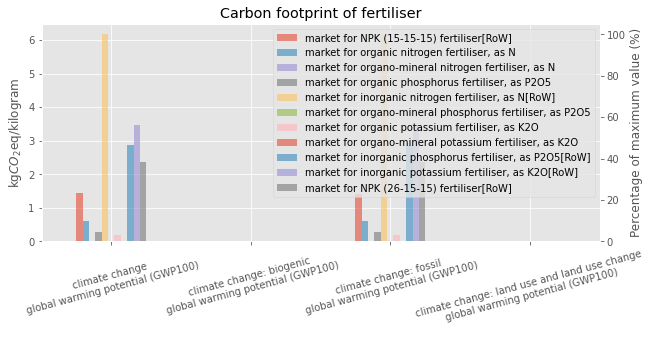

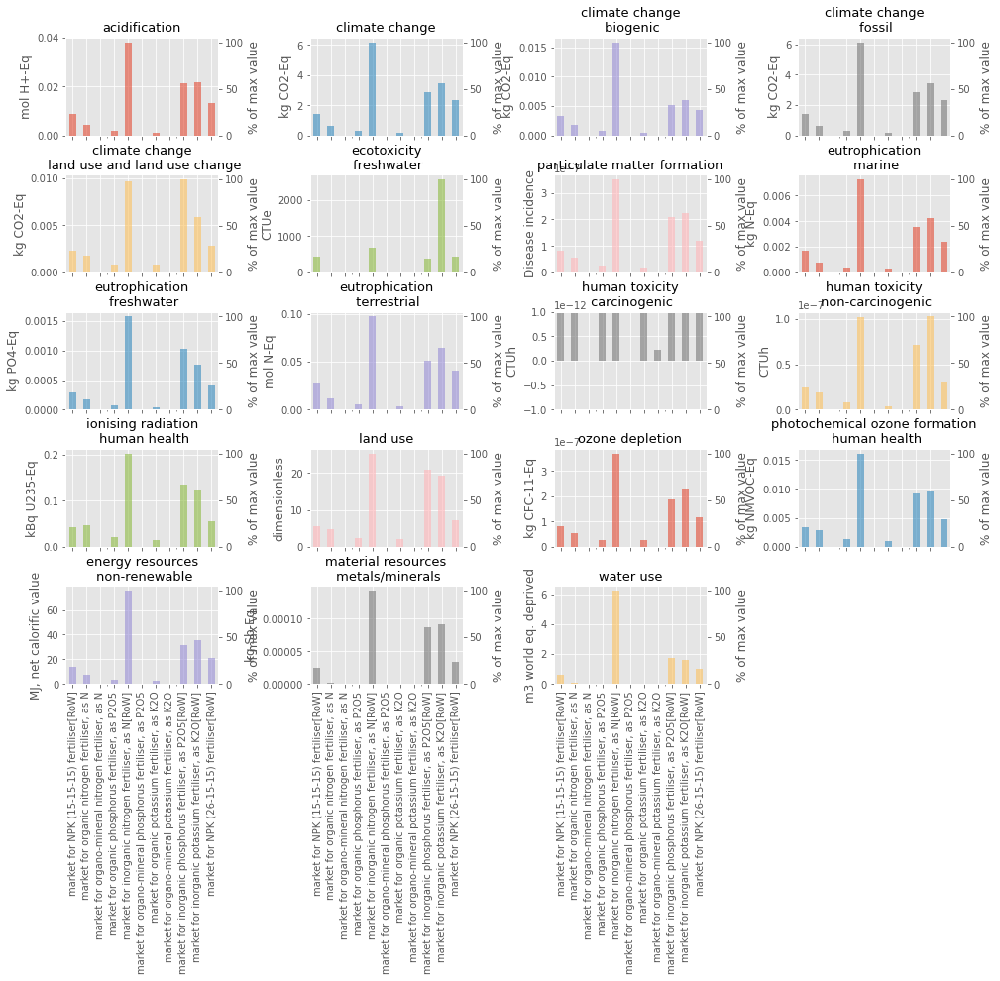

In [53]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

### Detailed analysis per dataset

- NPK (market for NPK (15-15-15) fertiliser) : > 20 of CO2eq from N2O, impact mainly from ammonium nitrate production and monoamonium phosphate production
- Organic (market for organic nitrogen fertiliser, as N) : very roughly one quarter transport, one quarter heat (for drying), one quater for electricity, and rest
- 'market for organo-mineral nitrogen fertiliser, as N' and 'market for organo-mineral phosphorus fertiliser, as P2O5' : zéro impact
- market for organo-mineral potassium fertiliser, as K2O :very low impact mainly from transport
- market for organic phosphorus fertiliser, as P2O5 and market for organic potassium fertiliser, as K2O : idem transport heat and electricity and rest.
- inorganic (market for inorganic nitrogen fertiliser, as N, and market for inorganic phosphorus fertiliser, as P2O5) : idem que NPK
- 'market for inorganic potassium fertiliser, as K2O' : impact from ammonium nitrate, potassium chroride and steam.
- 20 - 30% of GHG effect from N2O for inorganic
- 'market for NPK (26-15-15) fertiliser' : 30% of CO2eq from N2O


In [148]:
i = 10
list_act.list_act[i]

'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)

'market for NPK (26-15-15) fertiliser' (kilogram, RoW, None)
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')


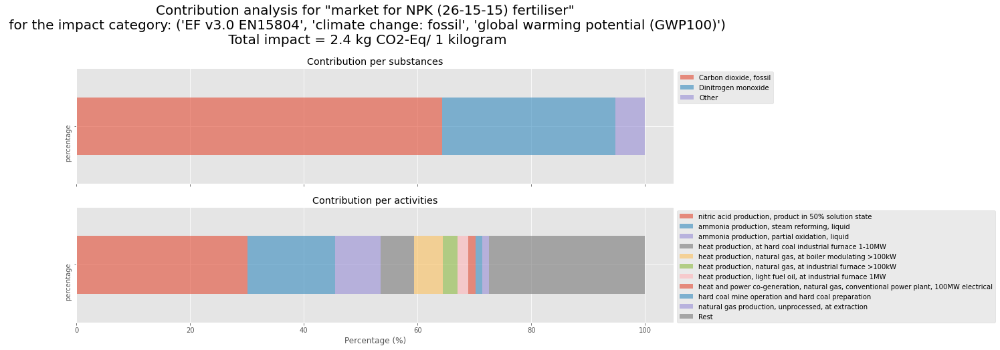

In [145]:
list_act.contribution_analysis(i = i,
                           methods = [methods_CC[2]],
                           save = True)              

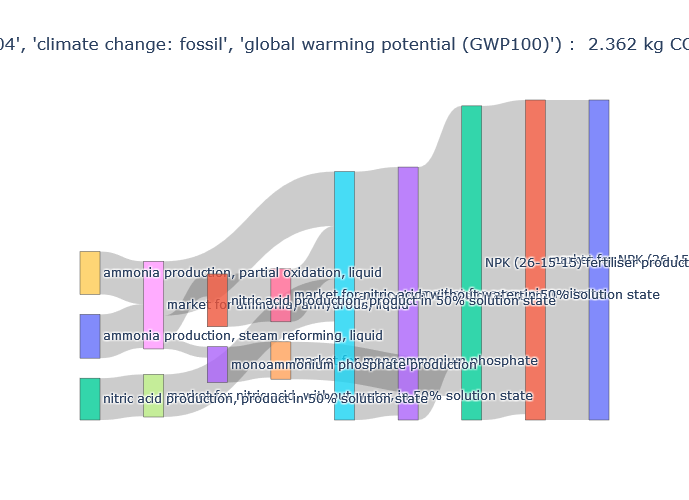

In [146]:
list_act.plot_sankey(i = i,
                      method = methods_CC[2],
                      cutoff = 0.1)       

,label,location,parent,value,value_pct
0,"market for inorganic potassium fertiliser, as K2O",RoW,,3.451344,100.000000
1,nutrient supply from NPK (15-15-15) fertiliser,RoW,"market for inorganic potassium fertiliser, as K2O",2.857224,82.785821
2,market for NPK (15-15-15) fertiliser,RoW,nutrient supply from NPK (15-15-15) fertiliser,2.857224,82.785823
3,NPK (15-15-15) fertiliser production,RoW,market for NPK (15-15-15) fertiliser,2.770630,80.276842
4,market for ammonium nitrate,RoW,NPK (15-15-15) fertiliser production,1.865813,54.060479
5,market for potassium chloride,RoW,NPK (15-15-15) fertiliser production,0.223470,6.474856
6,market for monoammonium phosphate,RoW,NPK (15-15-15) fertiliser production,0.553593,16.039921
7,ammonium nitrate production,RoW,market for ammonium nitrate,1.835012,53.168043
8,"market for ammonia, anhydrous, liquid",RoW,ammonium nitrate production,0.401394,11.630068
9,potassium chloride production,RoW,market for potassium chloride,0.593299,17.190360


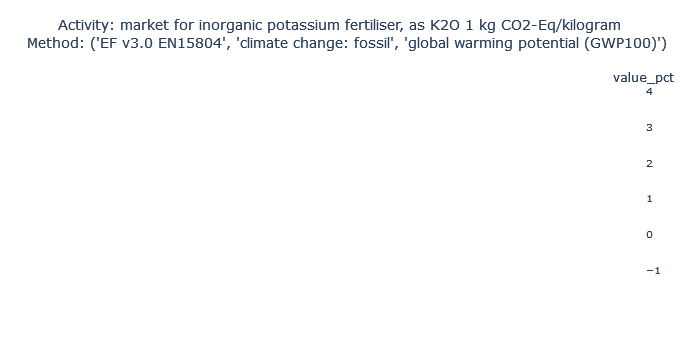

In [132]:
list_act.plot_sunburst(i = i,
                      method = methods_CC[2],
                      cutoff = 0.15)   

# Other fluxes

## K20

In [26]:
list_act = dbex.list_act(database = eidb,
                         name = 'K2O',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = False)

List of names:


{'inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O',
 'inorganic potassium fertiliser, as K2O to generic market for organo-mineral potassium fertiliser, as K2O',
 'market for inorganic potassium fertiliser, as K2O',
 'market for organic potassium fertiliser, as K2O',
 'market for organo-mineral potassium fertiliser, as K2O',
 'market group for inorganic potassium fertiliser, as K2O'}

List of locations:


{'AL',
 'AR',
 'AT',
 'AU',
 'BA',
 'BD',
 'BE',
 'BG',
 'BR',
 'CA',
 'CH',
 'CI',
 'CL',
 'CN',
 'CO',
 'CR',
 'CY',
 'CZ',
 'DE',
 'DK',
 'EC',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GLO',
 'GR',
 'HR',
 'HU',
 'ID',
 'IE',
 'IL',
 'IN',
 'IS',
 'IT',
 'KE',
 'LK',
 'LT',
 'LU',
 'LV',
 'MK',
 'MX',
 'MY',
 'NL',
 'NO',
 'NZ',
 'PE',
 'PH',
 'PL',
 'PT',
 'RER',
 'RO',
 'RS',
 'RU',
 'RoW',
 'SE',
 'SI',
 'SK',
 'TH',
 'TR',
 'UA',
 'US',
 'VN',
 'XK',
 'ZA'}

List of units:


{'kilogram'}

market for inorganic potassium fertiliser, as K2O[IS] (1.000000 kilogram)  \
                                                                                                                  input   
inorganic potassium fertiliser, as K2O         nutrient supply from NPK (15-15-15) fertiliser...                          
inorganic potassium fertiliser, as K2O#1                                                     NaN                          
inorganic potassium fertiliser, as K2O#10                                                    NaN                          
inorganic potassium fertiliser, as K2O#11                                                    NaN                          
inorganic potassium fertiliser, as K2O#12                                                    NaN                          
inorganic potassium fertiliser, as K2O#13                                                    NaN                          
inorganic potassium fertiliser, as K2O#14                                                    NaN                          
inorganic potassium fertiliser, as K2O#15                                                    NaN                          
inorganic potassium fertiliser, as K2O#16                                                    NaN                          
inorganic potassium fertiliser, as K2O#17                                                    NaN                          
inorganic potassium fertiliser, as K2O#18                                                    NaN                          
inorganic potassium fertiliser, as K2O#19                                                    NaN                          
inorganic potassium fertiliser, as K2O#2                                                     NaN                          
inorganic potassium fertiliser, as K2O#20                                                    NaN                          
inorganic potassium fertiliser, as K2O#21                                                    NaN                          
inorganic potassium fertiliser, as K2O#22                                                    NaN                          
inorganic potassium fertiliser, as K2O#23                                                    NaN                          
inorganic potassium fertiliser, as K2O#24                                                    NaN                          
inorganic potassium fertiliser, as K2O#25                                                    NaN                          
inorganic potassium fertiliser, as K2O#26                                                    NaN                          
inorganic potassium fertiliser, as K2O#27                                                    NaN                          
inorganic potassium fertiliser, as K2O#28                                                    NaN                          
inorganic potassium fertiliser, as K2O#29                                                    NaN                          
inorganic potassium fertiliser, as K2O#3                                                     NaN                          
inorganic potassium fertiliser, as K2O#30                                                    NaN                          
inorganic potassium fertiliser, as K2O#31                                                    NaN                          
inorganic potassium fertiliser, as K2O#32                                                    NaN                          
inorganic potassium fertiliser, as K2O#33                                                    NaN                          
inorganic potassium fertiliser, as K2O#34                                                    NaN                          
inorganic potassium fertiliser, as K2O#4                                                     NaN                          
inorganic potassium fertiliser, as K2O#5                                                     NaN              

All flows:


,"market for inorganic potassium fertiliser, as K2O_IS","market for inorganic potassium fertiliser, as K2O_DK","market for inorganic potassium fertiliser, as K2O_ES","market for inorganic potassium fertiliser, as K2O_BD","market for inorganic potassium fertiliser, as K2O_KE","inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O_GLO","market for inorganic potassium fertiliser, as K2O_MK","market for inorganic potassium fertiliser, as K2O_TH","market for inorganic potassium fertiliser, as K2O_IN","market for inorganic potassium fertiliser, as K2O_NL",...,"market for inorganic potassium fertiliser, as K2O_AT","market for inorganic potassium fertiliser, as K2O_ID","market for inorganic potassium fertiliser, as K2O_HR","market for inorganic potassium fertiliser, as K2O_EC","market for inorganic potassium fertiliser, as K2O_IE","market for inorganic potassium fertiliser, as K2O_BR","market for inorganic potassium fertiliser, as K2O_LK","market for inorganic potassium fertiliser, as K2O_RO","market for inorganic potassium fertiliser, as K2O_RoW","market for inorganic potassium fertiliser, as K2O_CZ"
"market for inorganic potassium fertiliser, as K2O",1.0,1.0,1.0,1.0,1.0,0.950417,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
nutrient supply from NPK (15-15-15) fertiliser,1.0,0.606557,0.377724,NaN,0.793478,NaN,0.928571,0.426424,0.317372,0.081325,...,0.443299,0.26576,1.0,0.050157,0.272401,0.019101,0.026365,1.0,0.362056,0.470588
nutrient supply from potash salt,NaN,0.098361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.121134,0.002482,NaN,0.021944,0.005735,NaN,NaN,NaN,0.012394,0.003676
nutrient supply from potassium chloride,NaN,0.245902,0.421308,0.99155,0.125,NaN,NaN,0.565107,0.681692,0.64759,...,0.280928,0.73017,NaN,0.761755,0.701792,0.974833,0.973635,NaN,0.575081,0.411765
nutrient supply from potassium nitrate,NaN,0.032787,0.135593,NaN,NaN,NaN,0.047619,NaN,NaN,0.100904,...,0.154639,NaN,NaN,0.031348,0.020072,0.001896,NaN,NaN,0.021402,0.0625
nutrient supply from potassium sulfate,NaN,0.016393,0.065375,0.00845,0.081522,NaN,0.02381,0.008469,0.000935,0.170181,...,NaN,0.001588,NaN,0.134796,NaN,0.004169,NaN,NaN,0.029066,0.051471
"inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O",NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market group for inorganic potassium fertiliser, as K2O",NaN,NaN,NaN,NaN,NaN,0.049583,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for organic potassium fertiliser, as K2O",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"nutrient supply from ash, from combustion of bagasse from sugarcane",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Technosphere flows:


,"market for inorganic potassium fertiliser, as K2O_IS","market for inorganic potassium fertiliser, as K2O_DK","market for inorganic potassium fertiliser, as K2O_ES","market for inorganic potassium fertiliser, as K2O_BD","market for inorganic potassium fertiliser, as K2O_KE","inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O_GLO","market for inorganic potassium fertiliser, as K2O_MK","market for inorganic potassium fertiliser, as K2O_TH","market for inorganic potassium fertiliser, as K2O_IN","market for inorganic potassium fertiliser, as K2O_NL",...,"market for inorganic potassium fertiliser, as K2O_AT","market for inorganic potassium fertiliser, as K2O_ID","market for inorganic potassium fertiliser, as K2O_HR","market for inorganic potassium fertiliser, as K2O_EC","market for inorganic potassium fertiliser, as K2O_IE","market for inorganic potassium fertiliser, as K2O_BR","market for inorganic potassium fertiliser, as K2O_LK","market for inorganic potassium fertiliser, as K2O_RO","market for inorganic potassium fertiliser, as K2O_RoW","market for inorganic potassium fertiliser, as K2O_CZ"
nutrient supply from NPK (15-15-15) fertiliser,1.0,0.606557,0.377724,NaN,0.793478,NaN,0.928571,0.426424,0.317372,0.081325,...,0.443299,0.26576,1.0,0.050157,0.272401,0.019101,0.026365,1.0,0.362056,0.470588
nutrient supply from potash salt,NaN,0.098361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.121134,0.002482,NaN,0.021944,0.005735,NaN,NaN,NaN,0.012394,0.003676
nutrient supply from potassium chloride,NaN,0.245902,0.421308,0.99155,0.125,NaN,NaN,0.565107,0.681692,0.64759,...,0.280928,0.73017,NaN,0.761755,0.701792,0.974833,0.973635,NaN,0.575081,0.411765
nutrient supply from potassium nitrate,NaN,0.032787,0.135593,NaN,NaN,NaN,0.047619,NaN,NaN,0.100904,...,0.154639,NaN,NaN,0.031348,0.020072,0.001896,NaN,NaN,0.021402,0.0625
nutrient supply from potassium sulfate,NaN,0.016393,0.065375,0.00845,0.081522,NaN,0.02381,0.008469,0.000935,0.170181,...,NaN,0.001588,NaN,0.134796,NaN,0.004169,NaN,NaN,0.029066,0.051471
"market group for inorganic potassium fertiliser, as K2O",NaN,NaN,NaN,NaN,NaN,0.049583,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for inorganic potassium fertiliser, as K2O",NaN,NaN,NaN,NaN,NaN,0.950417,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"nutrient supply from ash, from combustion of bagasse from sugarcane",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from coconut husk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrient supply from compost,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Biosphere flows:


,"market for inorganic potassium fertiliser, as K2O_IS","market for inorganic potassium fertiliser, as K2O_DK","market for inorganic potassium fertiliser, as K2O_ES","market for inorganic potassium fertiliser, as K2O_BD","market for inorganic potassium fertiliser, as K2O_KE","inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O_GLO","market for inorganic potassium fertiliser, as K2O_MK","market for inorganic potassium fertiliser, as K2O_TH","market for inorganic potassium fertiliser, as K2O_IN","market for inorganic potassium fertiliser, as K2O_NL",...,"market for inorganic potassium fertiliser, as K2O_AT","market for inorganic potassium fertiliser, as K2O_ID","market for inorganic potassium fertiliser, as K2O_HR","market for inorganic potassium fertiliser, as K2O_EC","market for inorganic potassium fertiliser, as K2O_IE","market for inorganic potassium fertiliser, as K2O_BR","market for inorganic potassium fertiliser, as K2O_LK","market for inorganic potassium fertiliser, as K2O_RO","market for inorganic potassium fertiliser, as K2O_RoW","market for inorganic potassium fertiliser, as K2O_CZ"


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"market for inorganic potassium fertiliser, as K2O[IS]",5.817967,-0.003684,5.807369,0.014283
"market for inorganic potassium fertiliser, as K2O[DK]",3.965460,-0.001763,3.958285,0.008938
"market for inorganic potassium fertiliser, as K2O[ES]",3.272319,-0.000664,3.266964,0.006019
"market for inorganic potassium fertiliser, as K2O[BD]",0.754573,-0.000929,0.753853,0.001649
"market for inorganic potassium fertiliser, as K2O[KE]",6.541012,0.014815,6.515388,0.010809
...,...,...,...,...
"market for inorganic potassium fertiliser, as K2O[BR]",0.894262,-0.000612,0.893009,0.001865
"market for inorganic potassium fertiliser, as K2O[LK]",0.933387,-0.000506,0.931954,0.001938
"market for inorganic potassium fertiliser, as K2O[RO]",5.817967,-0.003684,5.807369,0.014283
"market for inorganic potassium fertiliser, as K2O[RoW]",3.463277,0.006080,3.451344,0.005853


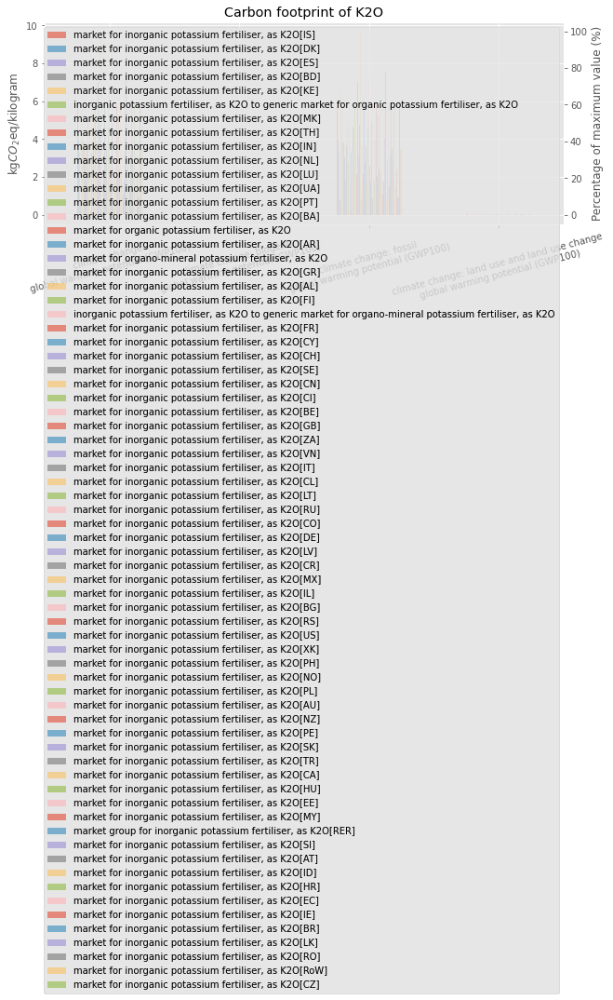

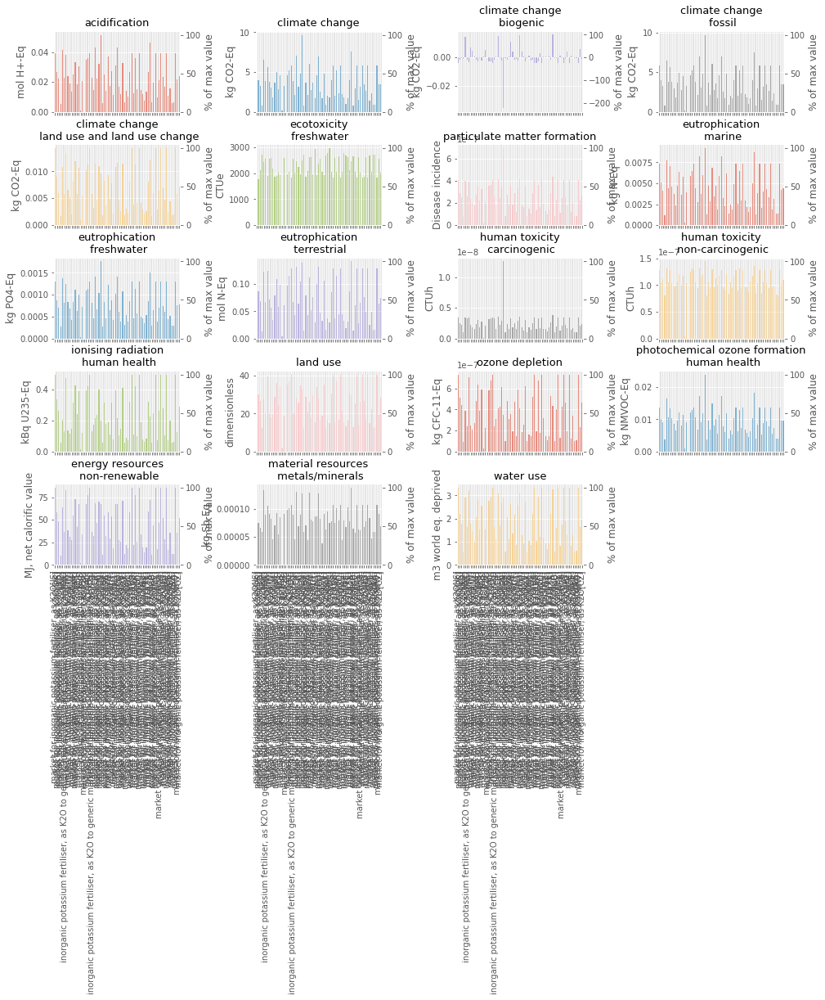

In [27]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

,climate change\nglobal warming potential (GWP100)
count,67.000000
mean,3.647927
std,1.934984
min,0.754573
25%,2.110480
50%,3.493657
75%,5.117741
max,9.666045


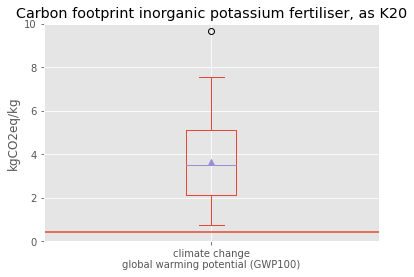

In [94]:
fig, ax = plt.subplots()
df.loc[[idx for idx in df.index if 'inorganic potassium fertiliser, as K2O' in idx]].plot(kind = 'box',
                                                                                          showmeans = True, 
                                                                                          ax = ax)
ax.set_ylim([0,10])
display(df.loc[[idx for idx in df.index if 'inorganic potassium fertiliser, as K2O' in idx]].describe())
plt.title('Carbon footprint inorganic potassium fertiliser, as K20')
plt.ylabel('kgCO2eq/kg')
plt.axhline(y = 0.4167, label = 'RED value')

,climate change\nglobal warming potential (GWP100)
count,4.000000
mean,1.969308
std,2.167081
min,0.000450
25%,0.140355
50%,2.015943
75%,3.844895
max,3.844895


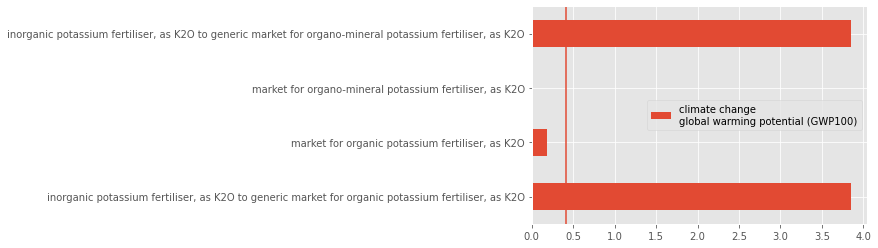

In [93]:
fig, ax = plt.subplots()
df.loc[[idx for idx in df.index if ' organ' in idx]].plot(kind = 'barh',
                                                          
                                                          ax = ax)
#ax.set_ylim([0,10])
display(df.loc[[idx for idx in df.index if ' organ' in idx]].describe())
df.loc[[idx for idx in df.index if ' organ' in idx]]
plt.axvline(x = 0.4167, label = 'RED value')

In [71]:
list_act.list_act[-2]

'market for inorganic potassium fertiliser, as K2O' (kilogram, RoW, None)

In [55]:
list_act.list_act

['market for inorganic potassium fertiliser, as K2O' (kilogram, IS, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, DK, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, ES, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, BD, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, KE, None),
 'inorganic potassium fertiliser, as K2O to generic market for organic potassium fertiliser, as K2O' (kilogram, GLO, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, MK, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, TH, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, IN, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, NL, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, LU, None),
 'market for inorganic potassium fertiliser, as K2O' (kilogram, UA, None),
 'market for inorganic potassium fertiliser, as K2O

'market for inorganic potassium fertiliser, as K2O' (kilogram, RoW, None)
('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: biogenic', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: fossil', 'global warming potential (GWP100)')
('EF v3.0 EN15804', 'climate change: land use and land use change', 'global warming potential (GWP100)')


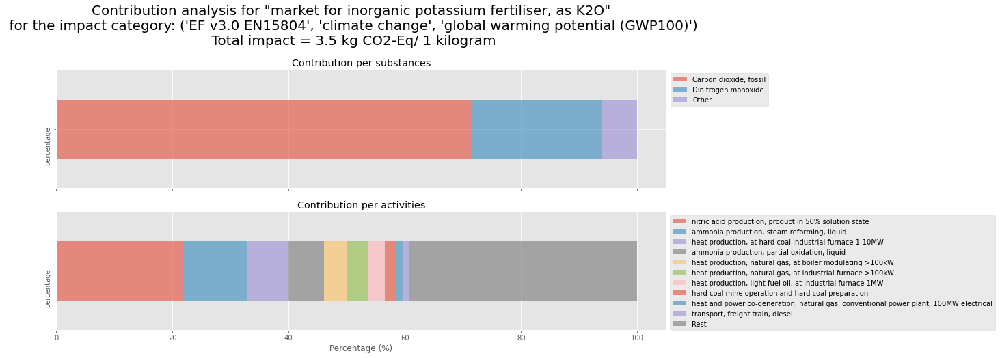

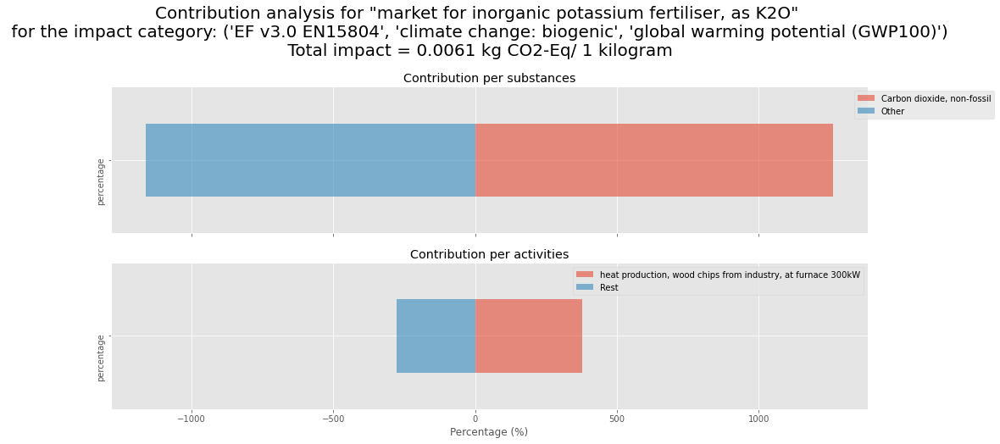

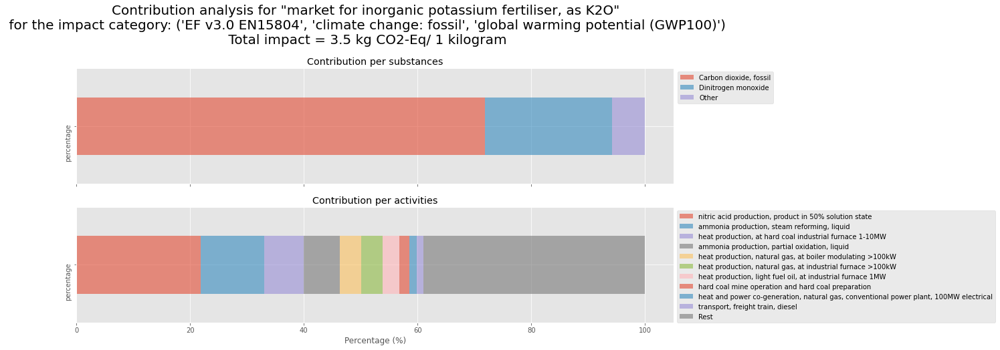

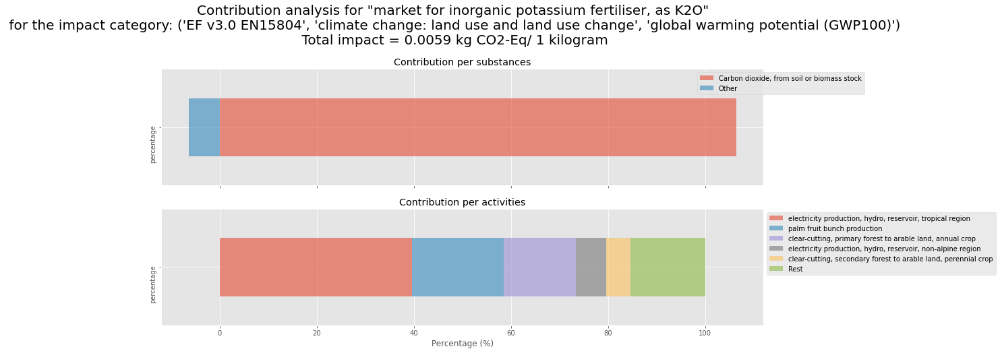

In [72]:
#14 pour l'organic et -2 pour le mineral
list_act.contribution_analysis(i = -2, methods=methods_CC)

In [61]:
methods_CC

[('EF v3.0 EN15804', 'climate change', 'global warming potential (GWP100)'),
 ('EF v3.0 EN15804',
  'climate change: biogenic',
  'global warming potential (GWP100)'),
 ('EF v3.0 EN15804',
  'climate change: fossil',
  'global warming potential (GWP100)'),
 ('EF v3.0 EN15804',
  'climate change: land use and land use change',
  'global warming potential (GWP100)')]

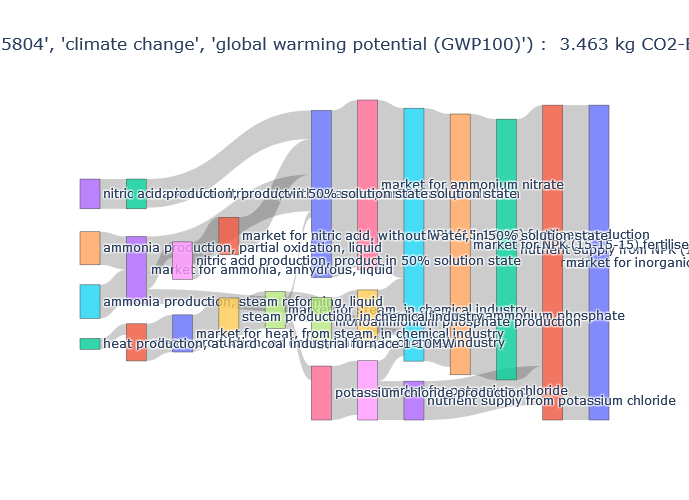

In [73]:
list_act.plot_sankey(i = -2,
                     method = methods_CC[0], 
                     cutoff = 0.08)

## CaO

In [82]:
list_act = dbex.list_act(database = eidb,
                         name = 'market for limestone,',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = True)

['market for limestone, unprocessed' (kilogram, RoW, None),
 'market for limestone, crushed, for mill' (kilogram, RoW, None),
 'market for limestone, crushed, washed' (kilogram, CH, None),
 'market for limestone, crushed, washed' (kilogram, RoW, None),
 'market for limestone, crushed, for mill' (kilogram, CH, None),
 'market for limestone, crushed, for mill' (kilogram, IN, None),
 'market for limestone, unprocessed' (kilogram, IN, None),
 'market for limestone, unprocessed' (kilogram, CH, None)]


List of names:


{'market for limestone, crushed, for mill',
 'market for limestone, crushed, washed',
 'market for limestone, unprocessed'}

List of locations:


{'CH', 'IN', 'RoW'}

List of units:


{'kilogram'}

'market for limestone, unprocessed' (kilogram, RoW, None)


"This is the market for  'limestone, unprocessed', in the Global geography.\nNo transport, since next step takes place in same location\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant."



'market for limestone, crushed, for mill' (kilogram, RoW, None)


'This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis product is generally considered to be used at the production site.  Therefore, the market does not contain any transport.\nThis is the market for  \'limestone, crushed, for mill\', in the Global geography.\nThe product "limestone, crushed, for mill" represents a naturally occurring mineral that consists principally of calcium carbonate but may also contain magnesium carbonate as a secondary component. It is found in many forms and is classified in terms of its origin, chemical composition, structure, and geological formation. Limestone occurs widely throughout the world and is a



'market for limestone, crushed, washed' (kilogram, CH, None)


'This is the market for  \'limestone, crushed, washed\', in the geography of Switzerland.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nAll the limestone produced in Switzerland is also used in Switzerland. Based on Swiss Impex database (www.swiss-impex.admin.ch, accessed 20160119, cathegory; 2521 - Limestone flux; limestone and other calcareous stone, of a kind used for the manufacture of lime or cement) there was 5E+7 kg of limestone imported to Switzerland in 2014. This amount is relativelly small in comparison with the production of limestone in Switzerland; 2.4E+09 kg.  \nThe transport distances in this market are taken fro



'market for limestone, crushed, washed' (kilogram, RoW, None)


'This is the market for  \'limestone, crushed, washed\', in the Global geography.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nIn this market, expert judgement was used to develop product specific transport distance estimations.\nThe product "limestone, crushed, washed" represents 1 kg of washed crushed limestone. \tLimestone is a naturally occurring mineral that consists principally of calcium carbonate but may also contain magnesium carbonate as a secondary component. It is found in many forms and is classified in terms of its origin, chemical composition, structure, and geological formation. Limestone occurs widely throughou



'market for limestone, crushed, for mill' (kilogram, CH, None)


'This is the market for  \'limestone, crushed, for mill\', in the geography of Switzerland.\nThe product "limestone, crushed, for mill" represents a naturally occurring mineral that consists principally of calcium carbonate but may also contain magnesium carbonate as a secondary component. It is found in many forms and is classified in terms of its origin, chemical composition, structure, and geological formation. Limestone occurs widely throughout the world and is an essential raw material for many industries. Limestone is generally used for construction, cement, quicklime, agriculture, metal refining and flue gas desulphurisation: Construction: Limestone is the most widely used crushed rock, although it is generally sold in form of sand and gravel. Cement: The production of cement is the main use for chalk, and a major use for dense, high-calcium limestone. Quicklime: Approximately 1.8 t of limestone is required per 1.0 t of quicklime. Agriculture: Many crops grow best under neutral 



'market for limestone, crushed, for mill' (kilogram, IN, None)


"This is the market for  'limestone, crushed, for mill', in the geography of India.\nLimestone is calcareous sedimentry rock consisting of carbonates. The two most important constitutes are calcite and dolomite. There are variety of limestone, however the limestone used by industries in bulk quantity is a sedimentry limestone. This product is generally considered to be used at the production site.  Therefore, the market does not contain any transport. This dataset does not considered imported limestone transport distance.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nGeography:  In India crushed limestone are consumed inside the



'market for limestone, unprocessed' (kilogram, IN, None)


"This is the market for  'limestone, unprocessed', in the geography of India.\nLimestone is calcareous sedimentary rock consisting essentially of carbonates. The two most importanat constituents are calcite and dolomite. There are variety of limestone, however the limestone used by industries in bulk quantity is a sedimentary limestone. The production of limestone in 2014-15 is 292.8 million tonnes. Rajasthan was the leading producing state accounting for 21% of the total production of limestone followed by Madhya Pradesh (13%), Andhra Pradesh (12%), Gujarat (9%), Karnataka, Telangana, Chattisgarh, and Tamil Nadu (4% each) and remaining 5% was contributed by Meghalaya, Odisha, Uttar Pradesh, Jharkhand, Assam, Kerala, Bihar. Cement was the major consuming industry accounting for 93% consumption followed by iron & steel (5%) and chemical (2%). Total limestone consumption by cement plant is 221.08 million tonnes in the year of 2014-15. In this market, expert judgement was used to develop 



'market for limestone, unprocessed' (kilogram, CH, None)


'The product "limestone, unprocessed" represents a naturally occurring mineral that consists principally of calcium carbonate. Limestone is generally used for construction, cement, quicklime, agriculture, metal refining and flue gas desulphurisation In construction, limestone is the most widely used crushed rock, although it is generally sold in form of sand and gravel. Cement: The production of cement is the main use for chalk, and a major use for dense, high-calcium limestone. Quicklime: Approximately 1.8 t of limestone is required per 1.0 t of quicklime.\nThis is the market for  \'limestone, unprocessed\', in the geography of Switzerland.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consu

market for limestone, unprocessed[RoW] (1.000000 kilogram)  \
                                                                                              input   
limestone, crushed, for mill                                                            NaN           
limestone, crushed, washed                                                              NaN           
limestone, unprocessed                                    limestone quarry operation[CA-QC]           
limestone, unprocessed#1                                    limestone quarry operation[RoW]           
transport, freight train                                                                NaN           
transport, freight, lorry, unspecified                                                  NaN           
transport, freight, lorry, unspecified#1                                                NaN           
transport, freight, lorry, unspecified#2                                                NaN           

                                                              \
                                            amount      unit   
limestone, crushed, for mill                   NaN       NaN   
limestone, crushed, washed                     NaN       NaN   
limestone, unprocessed                    0.000001  kilogram   
limestone, unprocessed#1                  0.999999  kilogram   
transport, freight train                       NaN       NaN   
transport, freight, lorry, unspecified         NaN       NaN   
transport, freight, lorry, unspecified#1       NaN       NaN   
transport, freight, lorry, unspecified#2       NaN       NaN   

                                         market for limestone, crushed, for mill[RoW] (1.000000 kilogram)  \
                                                                                                    input   
limestone, crushed, for mill                   limestone production, crushed, for mill[RoW]                 
limestone, crushed, washed                                                              NaN                 
limestone, unprocessed                                                                  NaN                 
limestone, unprocessed#1                                                                NaN                 
transport, freight train                                                                NaN                 
transport, freight, lorry, unspecified                                                  NaN                 
transport, freight, lorry, unspecified#1                                                NaN                 
transport, freight, lorry, unspecified#2                                                NaN                 

                                                           \
                                         amount      unit   
limestone, crushed, for mill                1.0  kilogram   
limestone, crushed, washed                  NaN       NaN   
limestone, unprocessed                      NaN       NaN   
limestone, unprocessed#1                    NaN       NaN   
transport, freight train                    NaN       NaN   
transport, freight, lorry, unspecified      NaN       NaN   
transport, freight, lorry, unspecified#1    NaN       NaN   
transport, freight, lorry, unspecified#2    NaN       NaN   

                                         market for limestone, crushed, washed[CH] (1.000000 kilogram)  \
                                                                                                 input   
limestone, crushed, for mill                                                            NaN              
limestone, crushed, washed                        limestone production, crushed, washed[CH]              
limestone, unprocessed                                                                  NaN              
limestone, unprocessed#1                                                                NaN              
transport, freight train       

All flows:


,"market for limestone, unprocessed_RoW","market for limestone, crushed, for mill_RoW","market for limestone, crushed, washed_CH","market for limestone, crushed, washed_RoW","market for limestone, crushed, for mill_CH","market for limestone, crushed, for mill_IN","market for limestone, unprocessed_IN","market for limestone, unprocessed_CH"
"market for limestone, unprocessed",1.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
limestone quarry operation,1.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
"market for limestone, crushed, for mill",NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN
"limestone production, crushed, for mill",NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN
"market for transport, freight, lorry, unspecified",NaN,NaN,0.02026,0.02,NaN,NaN,0.009782,NaN
"market for transport, freight train",NaN,NaN,0.00372,NaN,NaN,NaN,NaN,NaN
"market for limestone, crushed, washed",NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN
"limestone production, crushed, washed",NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN


Technosphere flows:


,"market for limestone, unprocessed_RoW","market for limestone, crushed, for mill_RoW","market for limestone, crushed, washed_CH","market for limestone, crushed, washed_RoW","market for limestone, crushed, for mill_CH","market for limestone, crushed, for mill_IN","market for limestone, unprocessed_IN","market for limestone, unprocessed_CH"
limestone quarry operation,1.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
"limestone production, crushed, for mill",NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN
"market for transport, freight, lorry, unspecified",NaN,NaN,0.02026,0.02,NaN,NaN,0.009782,NaN
"market for transport, freight train",NaN,NaN,0.00372,NaN,NaN,NaN,NaN,NaN
"limestone production, crushed, washed",NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN


Biosphere flows:


,"market for limestone, unprocessed_RoW","market for limestone, crushed, for mill_RoW","market for limestone, crushed, washed_CH","market for limestone, crushed, washed_RoW","market for limestone, crushed, for mill_CH","market for limestone, crushed, for mill_IN","market for limestone, unprocessed_IN","market for limestone, unprocessed_CH"


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"market for limestone, unprocessed[RoW]",0.002123,-1.735300e-07,0.002122,6.907915e-07
"market for limestone, crushed, for mill[RoW]",0.002799,1.302272e-05,0.002785,1.366048e-06
"market for limestone, crushed, washed[CH]",0.004936,1.886380e-05,0.004916,2.010390e-06
"market for limestone, crushed, washed[RoW]",0.005727,1.925857e-05,0.005685,2.207638e-05
"market for limestone, crushed, for mill[CH]",0.002215,1.368512e-05,0.002200,8.474472e-07
"market for limestone, crushed, for mill[IN]",0.006084,-1.959540e-05,0.006101,2.210970e-06
"market for limestone, unprocessed[IN]",0.004342,-1.139994e-05,0.004352,1.951312e-06
"market for limestone, unprocessed[CH]",0.002068,2.731997e-07,0.002067,6.411304e-07


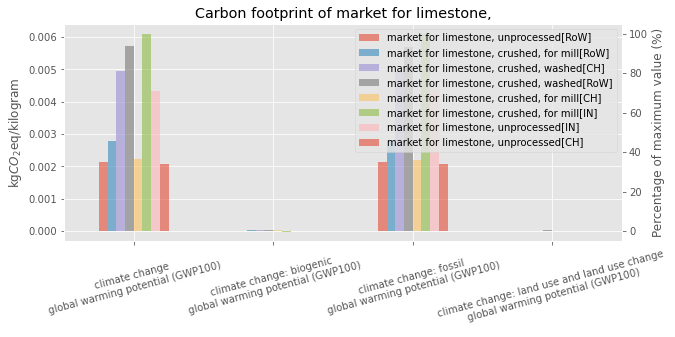

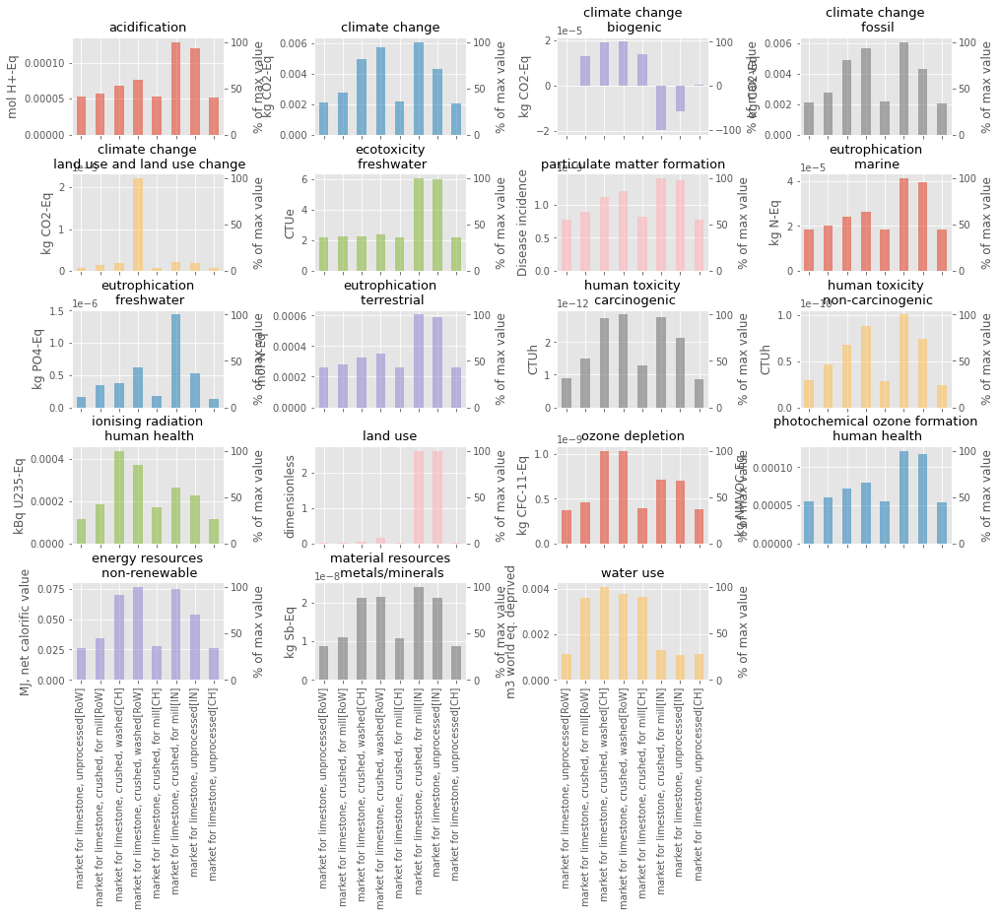

In [85]:
list_act.analyse(methods_CC, methods_EF, print_mode = 3)

In [81]:
for act in list_act.list_act:
    if 'agriculture' in act['comment']:
        print(act)
        print(act

'market for limestone, unprocessed' (kilogram, CH, None)
'market for limestone, crushed, washed' (kilogram, RoW, None)
'market for limestone, crushed, washed' (kilogram, CH, None)
'market for limestone, crushed, for mill' (kilogram, CH, None)
'market for limestone, crushed, for mill' (kilogram, RoW, None)


In [78]:
[act for act in eidb if 'market for lime' in act['name']]

['market for lime, packed' (kilogram, Europe without Switzerland, None),
 'market for limestone, crushed, for mill' (kilogram, CH, None),
 'market for lime, packed' (kilogram, RoW, None),
 'market for lime' (kilogram, RoW, None),
 'market for lime mortar' (kilogram, GLO, None),
 'market for limestone, crushed, washed' (kilogram, CH, None),
 'market for limestone residue' (kilogram, CH, None),
 'market for lime, hydrated, packed' (kilogram, RoW, None),
 'market for lime, hydrated, loose weight' (kilogram, CH, None),
 'market for limestone quarry infrastructure' (unit, GLO, None),
 'market for limestone, crushed, for mill' (kilogram, RoW, None),
 'market for lime' (kilogram, RER, None),
 'market for limestone, unprocessed' (kilogram, CH, None),
 'market for lime, hydrated, loose weight' (kilogram, RoW, None),
 'market for lime, packed' (kilogram, CH, None),
 'market for lime, hydraulic' (kilogram, RoW, None),
 'market for limestone, unprocessed' (kilogram, IN, None),
 'market for lime, h

## CaCO3

In [95]:
list_act = dbex.list_act(database = eidb,
                         name = 'CaCO3',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = True)

['market for soil pH raising agent, as CaCO3' (kilogram, GLO, None)]


List of names:


{'market for soil pH raising agent, as CaCO3'}

List of locations:


{'GLO'}

List of units:


{'kilogram'}

'market for soil pH raising agent, as CaCO3' (kilogram, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nTransport from producers to consumers of this product in the geography covered by the market is included.\nThis is the market for 'soil pH raising agent, as CaCO3', in the the Global geography. This is a generic market; the suppliers of this market make available this generic product by redirecting a part of the production of several more specific products.\nsoil pH raising agent, as CaCO3'  is a inorganic substance with the ability to raise the pH value of soil. It is solid under normal conditions of temperature and pressure. It is modelled as a pure substance, and the ability to ra

In [96]:
agb.multiLCAAlgebric(list_act.list_act, methods_CC)

,climate change - global warming potential (GWP100)[kg CO2-Eq],climate change: biogenic - global warming potential (GWP100)[kg CO2-Eq],climate change: fossil - global warming potential (GWP100)[kg CO2-Eq],climate change: land use and land use change - global warming potential (GWP100)[kg CO2-Eq]
"market for soil pH raising agent, as CaCO3",0.089377,0.000296,0.088976,0.000105


In [ ]:
[act for act in 

## Pesticide

In [98]:
[act for act in eidb if 'pesti' in act['name']]

['packaging production for solid fertiliser or pesticide, per kilogram of packed product' (kilogram, GLO, None),
 'market for packaging, for fertilisers or pesticides' (kilogram, GLO, None),
 'market for pesticide, unspecified' (kilogram, GLO, None),
 'pesticide production, unspecified' (kilogram, RER, None),
 'market for packaging, for pesticides' (kilogram, GLO, None),
 'pesticide production, unspecified' (kilogram, RoW, None),
 'packaging production for pesticide, per kilogram of packed product' (kilogram, GLO, None),
 'dichloropropene to generic market for pesticide, unspecified' (kilogram, GLO, None),
 'packaging production for liquid fertiliser or pesticide, per kilogram of packed product' (kilogram, GLO, None)]

In [99]:
list_act = dbex.list_act(database = eidb,
                         name = 'market for pesticide',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = True)

['dichloropropene to generic market for pesticide, unspecified' (kilogram, GLO, None),
 'market for pesticide, unspecified' (kilogram, GLO, None)]


List of names:


{'dichloropropene to generic market for pesticide, unspecified',
 'market for pesticide, unspecified'}

List of locations:


{'GLO'}

List of units:


{'kilogram'}

'dichloropropene to generic market for pesticide, unspecified' (kilogram, GLO, None)


'This is a linking activity which links the product dichloropropene to the generic market for pesticide, unspecified. All chemicals that enter this market provide the function of a pesticide.\nGeography:   1,3-dichloropropene is used as a pesticide in the United States, Europe, Japan, the Philippines, and Africa. It is phased out in the EU (http://eur-lex.europa.eu/LexUriServ/site/en/oj/2007/l_249/l_24920070925en00110013.pdf). '



'market for pesticide, unspecified' (kilogram, GLO, None)


"pesticide, unspecified'  represents organic substances which are applied as pesticides. They are mostly liquid under normal conditions of temperature and pressure. The dataset was modelled from the arithmetic mean of all inputs and outputs of the production of several representing substances. The reference product is modelled to represent a pure substance.\nThis is the market for 'pesticide, unspecified', in the the Global geography. This is a generic market; the suppliers of this market make available this generic product by redirecting a part of the production of several more specific products.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, w

All flows:


,"dichloropropene to generic market for pesticide, unspecified_GLO","market for pesticide, unspecified_GLO"
market for dichloropropene,1.0,NaN
"dichloropropene to generic market for pesticide, unspecified",1.0,0.061099
"market group for transport, freight train",NaN,0.0776
"market for transport, freight, sea, container ship",NaN,0.3677
"market for pesticide, unspecified",NaN,1.0
"market group for transport, freight, lorry, unspecified",NaN,0.3132
"market group for transport, freight, light commercial vehicle",NaN,0.0097
"pesticide production, unspecified",NaN,0.938901


Technosphere flows:


,"dichloropropene to generic market for pesticide, unspecified_GLO","market for pesticide, unspecified_GLO"
market for dichloropropene,1.0,NaN
"market group for transport, freight train",NaN,0.0776
"market for transport, freight, sea, container ship",NaN,0.3677
"market group for transport, freight, lorry, unspecified",NaN,0.3132
"market group for transport, freight, light commercial vehicle",NaN,0.0097
"dichloropropene to generic market for pesticide, unspecified",NaN,0.061099
"pesticide production, unspecified",NaN,0.938901


Biosphere flows:


,"dichloropropene to generic market for pesticide, unspecified_GLO","market for pesticide, unspecified_GLO"


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"dichloropropene to generic market for pesticide, unspecified",3.822726,0.025165,3.794188,0.003373
"market for pesticide, unspecified",9.984387,0.041996,9.931351,0.011039


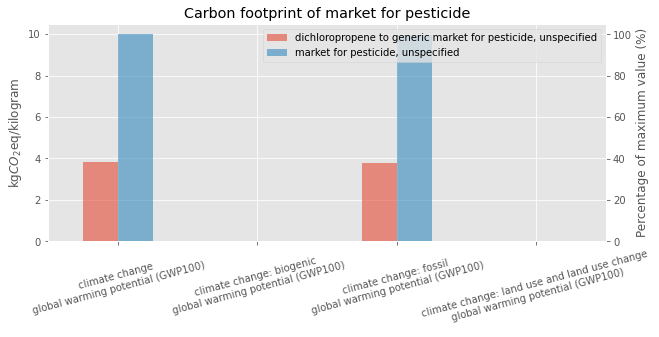

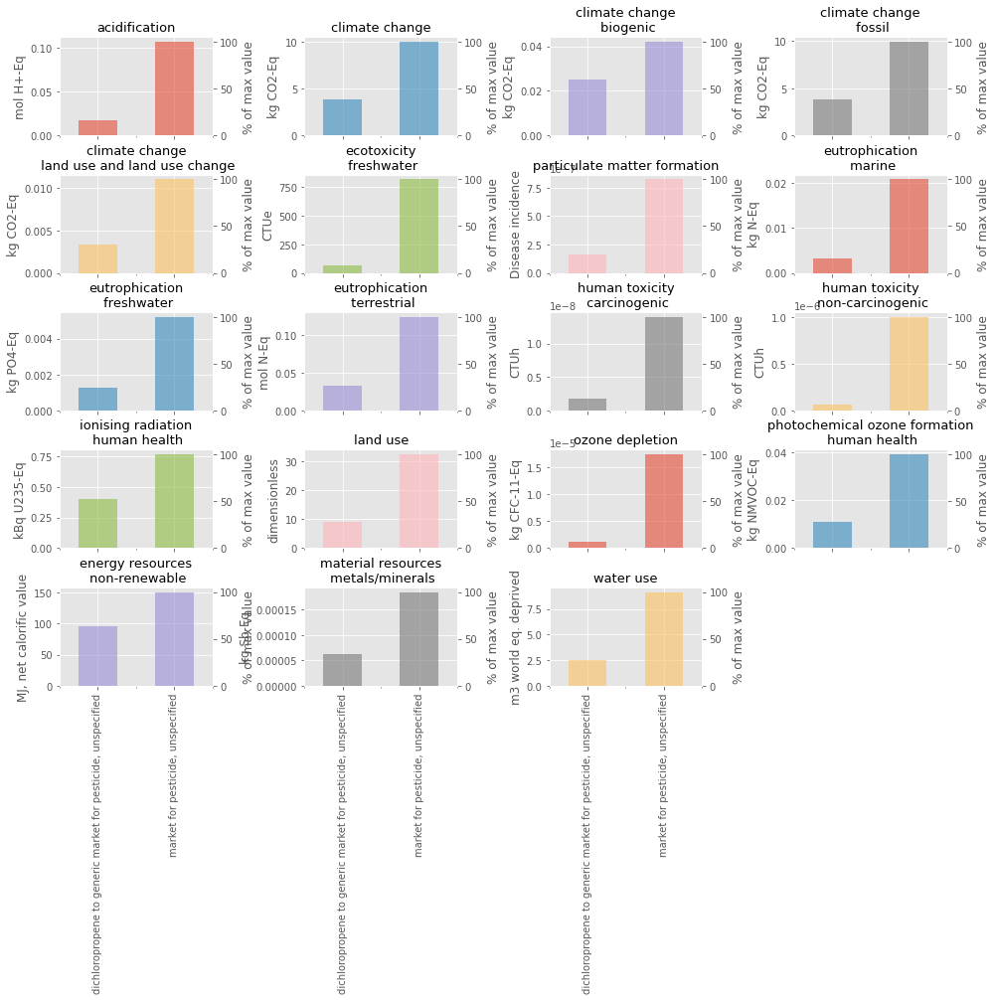

In [101]:
list_act.analyse(methods_CC, methods_EF, 3)

## Maize

In [104]:
[act for act in eidb if 'maize seed' in act['name']]

['maize seed production, for sowing' (kilogram, GLO, None),
 'market for maize seed, for sowing' (kilogram, GLO, None),
 'maize seed production, Swiss integrated production, at farm' (kilogram, CH, None),
 'maize seed production, organic, for sowing' (kilogram, RoW, None),
 'maize seed production, organic, at farm' (kilogram, RoW, None),
 'market for maize seed, organic, for sowing' (kilogram, GLO, None),
 'market for maize seed, Swiss integrated production, for sowing' (kilogram, GLO, None),
 'maize seed production, Swiss integrated production, for sowing' (kilogram, CH, None),
 'maize seed production, organic, at farm' (kilogram, CH, None),
 'market for maize seed, Swiss integrated production, at farm' (kilogram, CH, None),
 'market for maize seed, organic, at farm' (kilogram, GLO, None),
 'maize seed production, at farm' (kilogram, GLO, None),
 'maize seed production, organic, for sowing' (kilogram, CH, None),
 'market for maize seed, at farm' (kilogram, GLO, None)]

In [105]:
list_act = dbex.list_act(database = eidb,
                         name = 'maize seed',
                         unit = 'kilogram')

list_act.explore(strict = False, 
                 comments = True)

['maize seed production, organic, for sowing' (kilogram, RoW, None),
 'maize seed production, organic, at farm' (kilogram, CH, None),
 'maize seed production, at farm' (kilogram, GLO, None),
 'maize seed production, for sowing' (kilogram, GLO, None),
 'maize seed production, organic, for sowing' (kilogram, CH, None),
 'market for maize seed, Swiss integrated production, for sowing' (kilogram, GLO, None),
 'maize seed production, organic, at farm' (kilogram, RoW, None),
 'market for maize seed, at farm' (kilogram, GLO, None),
 'maize seed production, Swiss integrated production, at farm' (kilogram, CH, None),
 'market for maize seed, for sowing' (kilogram, GLO, None),
 'market for maize seed, organic, at farm' (kilogram, GLO, None),
 'market for maize seed, organic, for sowing' (kilogram, GLO, None),
 'maize seed production, Swiss integrated production, for sowing' (kilogram, CH, None),
 'market for maize seed, Swiss integrated production, at farm' (kilogram, CH, None)]


List of names:


{'maize seed production, Swiss integrated production, at farm',
 'maize seed production, Swiss integrated production, for sowing',
 'maize seed production, at farm',
 'maize seed production, for sowing',
 'maize seed production, organic, at farm',
 'maize seed production, organic, for sowing',
 'market for maize seed, Swiss integrated production, at farm',
 'market for maize seed, Swiss integrated production, for sowing',
 'market for maize seed, at farm',
 'market for maize seed, for sowing',
 'market for maize seed, organic, at farm',
 'market for maize seed, organic, for sowing'}

List of locations:


{'CH', 'GLO', 'RoW'}

List of units:


{'kilogram'}

'maize seed production, organic, for sowing' (kilogram, RoW, None)


'Refers to 1 kg of maize seed (fresh weight), with a maximum water content of 12%\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made du



'maize seed production, organic, at farm' (kilogram, CH, None)


'This dataset represents the production of 1 kg of maize seed (fresh matter). The yield is 2600 kg/ha at a moisture content at storage of 14%.\n\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change r



'maize seed production, at farm' (kilogram, GLO, None)


'This dataset represents the production of 1 kg of maize seed (fresh matter). The yield is 3000 kg/ha at a moisture content at storage of 14%.\n\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change r



'maize seed production, for sowing' (kilogram, GLO, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nRefers to 1 kg of maize seed (fresh weight), with a



'maize seed production, organic, for sowing' (kilogram, CH, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nRefers to 1 kg of maize seed (fresh weight), with a



'market for maize seed, Swiss integrated production, for sowing' (kilogram, GLO, None)


"This is the market for  'maize seed, Swiss integrated production, for sowing', in the Global geography.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThe product 'maize seed, Swiss integrated production, for sowing' is a seed. It is an annual crop. This seed product is used for plant propagation. The seed produced at the farm is transported to the processing centre, treated (pre-cleaning, cleaning, eventually drying, chemical dressing (for integrated production) and bag filling), stored and afterwards transported to the regional stor



'maize seed production, organic, at farm' (kilogram, RoW, None)


'This dataset represents the production of 1 kg of maize seed (fresh matter). The yield is 2600 kg/ha at a moisture content at storage of 14%.\n\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change r



'market for maize seed, at farm' (kilogram, GLO, None)


"This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nTransport from producers to consumers of this product in the geography covered by the market is included.\nThe product 'maize seed, at farm' is a seed. It is an annual crop.\nThis is the market for  'maize seed, at farm', in the Global geography."



'maize seed production, Swiss integrated production, at farm' (kilogram, CH, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThis dataset represents the production of 1 kg of m



'market for maize seed, for sowing' (kilogram, GLO, None)


"This is the market for  'maize seed, for sowing', in the Global geography.\nThe product 'maize seed, for sowing' is a seed. It is an annual crop. This seed product is used for plant propagation. The product is treated (pre-cleaning, cleaning, eventually drying, chemical dressing (for integrated production) and bag filling), and stored.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis market contains no transport or losses, as they are irrelevant for the delivered product."



'market for maize seed, organic, at farm' (kilogram, GLO, None)


"The product 'maize seed, organic, at farm' is a seed. It is an annual crop. The product is treated (pre-cleaning, cleaning, eventually drying, chemical dressing (for integrated production) and bag filling), and stored. This product is produced through organic agricultural practices which do not include fertiliser and pesticide application.\nTransport from producers to consumers of this product in the geography covered by the market is included.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis is the market for  'maize seed, organic, at farm', in the Global geography."



'market for maize seed, organic, for sowing' (kilogram, GLO, None)


"The product 'maize seed, organic, for sowing' is a seed. It is an annual crop. This seed product is used for plant propagation. The product is treated (pre-cleaning, cleaning, eventually drying, chemical dressing (for integrated production) and bag filling), and stored. This product is produced through organic agricultural practices which do not include fertiliser and pesticide application.\nThis market contains no transport or losses, as they are irrelevant for the delivered product.\nThis is the market for  'maize seed, organic, for sowing', in the Global geography.\nThis is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant."



'maize seed production, Swiss integrated production, for sowing' (kilogram, CH, None)


'Refers to 1 kg of maize seed (fresh weight), with a maximum water content of 12%\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made du



'market for maize seed, Swiss integrated production, at farm' (kilogram, CH, None)


'This is a market activity. Each market represents the consumption mix of a product in a given geography, connecting suppliers with consumers of the same product in the same geographical area. Markets group the producers and also the imports of the product (if relevant) within the same geographical area. They also account for transport to the consumer and for the losses during that process, when relevant.\nThis dataset represents the supply of 1 kg of \'maize seed, Swiss integrated production, at farm\' from activities that produce it within the geography of CH. Transportation is included in this market, based on Valsasina, L. (2016), "Default transport data per commodity group for Switzerland, ecoinvent database version 3.3, ecoinvent Centre, Zürich, Switzerland", available on the ecoinvent\'s website http://www.ecoinvent.org/. More details can be found in the exchange comments of the transportation. '

Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
E

maize seed production, organic, for sowing[RoW] (1.000000 kilogram)  \
                                                                                                                 input   
Ammonia                                                                                           NaN                    
Atrazine                                                                                          NaN                    
Cadmium                                                                                           NaN                    
Cadmium, ion                                                                                      NaN                    
Cadmium, ion#1                                                                                    NaN                    
...                                                                                               ...                    
transport, freight, lorry, unspecified                                                            NaN                    
transport, freight, sea, bulk carrier for dry g...                                                NaN                    
transport, tractor and trailer, agricultural                                                      NaN                    
transport, tractor and trailer, agricultural#1                                                    NaN                    
triazine-compound, unspecified                                                                    NaN                    

                                                                \
                                                   amount unit   
Ammonia                                               NaN  NaN   
Atrazine                                              NaN  NaN   
Cadmium                                               NaN  NaN   
Cadmium, ion                                          NaN  NaN   
Cadmium, ion#1                                        NaN  NaN   
...                                                   ...  ...   
transport, freight, lorry, unspecified                NaN  NaN   
transport, freight, sea, bulk carrier for dry g...    NaN  NaN   
transport, tractor and trailer, agricultural          NaN  NaN   
transport, tractor and trailer, agricultural#1        NaN  NaN   
triazine-compound, unspecified                        NaN  NaN   

                                                   maize seed production, organic, at farm[CH] (1.000000 kilogram)  \
                                                                                                             input   
Ammonia                                                                                       Ammonia                
Atrazine                                                                                          NaN                
Cadmium                                                                                       Cadmium                
Cadmium, ion                                                                             Cadmium, ion                
Cadmium, ion#1                                                                           Cadmium, ion                
...                                                                                               ...                
transport, freight, lorry, unspecified                                                            NaN                
transport, freight, sea, bulk carrier for dry g...                                                NaN                
transport, tractor and trailer, agricultural        market for transport, tractor and trailer, agr...                
transport, tractor and trailer, agricultural#1                                                    NaN                
triazine-compound, unspecified                                                                    NaN                

                                                                      

All flows:


,"maize seed production, organic, for sowing_RoW","maize seed production, organic, at farm_CH","maize seed production, at farm_GLO","maize seed production, for sowing_GLO","maize seed production, organic, for sowing_CH","market for maize seed, Swiss integrated production, for sowing_GLO","maize seed production, organic, at farm_RoW","market for maize seed, at farm_GLO","maize seed production, Swiss integrated production, at farm_CH","market for maize seed, for sowing_GLO","market for maize seed, organic, at farm_GLO","market for maize seed, organic, for sowing_GLO","maize seed production, Swiss integrated production, for sowing_CH","market for maize seed, Swiss integrated production, at farm_CH"
"market for building, multi-storey",0.00002,NaN,NaN,0.00002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"maize seed production, organic, for sowing",1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
"market for maize seed, organic, at farm",1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
"market for electricity, low voltage",0.003205,0.015,NaN,NaN,0.058,NaN,0.000829,NaN,0.013,NaN,NaN,NaN,0.058,NaN
"market group for electricity, low voltage",0.054795,NaN,0.013,0.058,NaN,NaN,0.014171,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"fertilising, by broadcaster",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001,NaN,NaN,NaN,NaN,NaN
"application of plant protection product, by field sprayer",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000567,NaN,NaN,NaN,NaN,NaN
"market for maize seed, Swiss integrated production, at farm",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3,1.0
"market for transport, freight, lorry, unspecified",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.058322


Technosphere flows:


,"maize seed production, organic, for sowing_RoW","maize seed production, organic, at farm_CH","maize seed production, at farm_GLO","maize seed production, for sowing_GLO","maize seed production, organic, for sowing_CH","market for maize seed, Swiss integrated production, for sowing_GLO","maize seed production, organic, at farm_RoW","market for maize seed, at farm_GLO","maize seed production, Swiss integrated production, at farm_CH","market for maize seed, for sowing_GLO","market for maize seed, organic, at farm_GLO","market for maize seed, organic, for sowing_GLO","maize seed production, Swiss integrated production, for sowing_CH","market for maize seed, Swiss integrated production, at farm_CH"
"market for building, multi-storey",0.00002,NaN,NaN,0.00002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for maize seed, organic, at farm",1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for electricity, low voltage",0.003205,0.015,NaN,NaN,0.058,NaN,0.000829,NaN,0.013,NaN,NaN,NaN,0.058,NaN
"market group for electricity, low voltage",0.054795,NaN,0.013,0.058,NaN,NaN,0.014171,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"market for transport, tractor and trailer, agricultural",NaN,0.01,0.01,NaN,NaN,NaN,0.01,NaN,0.01,NaN,NaN,NaN,NaN,NaN
"tillage, ploughing",NaN,0.000385,NaN,NaN,NaN,NaN,NaN,NaN,0.000333,NaN,NaN,NaN,NaN,NaN
"green manure growing, organic, until April",NaN,0.000385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
market for irrigation,NaN,0.055001,NaN,NaN,NaN,NaN,0.055001,NaN,0.047667,NaN,NaN,NaN,NaN,NaN
"solid manure loading and spreading, by hydraulic loader and spreader",NaN,7.0661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"drying of bread grain, seed and legumes",NaN,0.35385,NaN,NaN,NaN,NaN,NaN,NaN,0.35385,NaN,NaN,NaN,0.35385,NaN


Biosphere flows:


,"maize seed production, organic, for sowing_RoW","maize seed production, organic, at farm_CH","maize seed production, at farm_GLO","maize seed production, for sowing_GLO","maize seed production, organic, for sowing_CH","market for maize seed, Swiss integrated production, for sowing_GLO","maize seed production, organic, at farm_RoW","market for maize seed, at farm_GLO","maize seed production, Swiss integrated production, at farm_CH","market for maize seed, for sowing_GLO","market for maize seed, organic, at farm_GLO","market for maize seed, organic, for sowing_GLO","maize seed production, Swiss integrated production, for sowing_CH","market for maize seed, Swiss integrated production, at farm_CH"
"Transformation, to industrial area",0.000004,NaN,NaN,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000004,NaN
"Occupation, industrial area",0.0002,NaN,NaN,0.0002,0.0002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0002,NaN
"Occupation, construction site",0.000008,NaN,NaN,0.000008,0.000008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000008,NaN
"Transformation, from unspecified",0.000004,NaN,NaN,0.000004,0.000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000004,NaN
Mercury,NaN,0.000001,NaN,NaN,NaN,NaN,0.000001,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Phosphate,NaN,0.000099,0.000086,NaN,NaN,NaN,0.000099,NaN,0.000086,NaN,NaN,NaN,NaN,NaN
"Nickel, ion",NaN,0.000001,0.000001,NaN,NaN,NaN,0.000001,NaN,0.000001,NaN,NaN,NaN,NaN,NaN
Nitrogen oxides,NaN,0.000323,0.000166,NaN,NaN,NaN,0.000323,NaN,0.000166,NaN,NaN,NaN,NaN,NaN
Water,NaN,0.055001,NaN,NaN,NaN,NaN,0.055001,NaN,0.047667,NaN,NaN,NaN,NaN,NaN
Phosphorus,NaN,0.000055,0.000048,NaN,NaN,NaN,0.000055,NaN,0.000048,NaN,NaN,NaN,NaN,NaN


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"maize seed production, organic, for sowing[RoW]",0.059401,-1.525333,1.583617,0.001117
"maize seed production, organic, at farm[CH]",-0.516723,-1.508927,0.991870,0.000334
"maize seed production, at farm",0.008570,-1.370208,1.377545,0.001234
"maize seed production, for sowing",0.661772,-1.362318,2.022028,0.002062
"maize seed production, organic, for sowing[CH]",0.020192,-1.524319,1.543480,0.001031
"market for maize seed, Swiss integrated production, for sowing",-0.039838,-1.388944,1.347867,0.001239
"maize seed production, organic, at farm[RoW]",-0.013210,-1.525374,1.511252,0.000912
"market for maize seed, at farm",0.042233,-1.370151,1.411037,0.001347
"maize seed production, Swiss integrated production, at farm[CH]",-0.546044,-1.505444,0.958700,0.000699
"market for maize seed, for sowing",0.661772,-1.362318,2.022028,0.002062


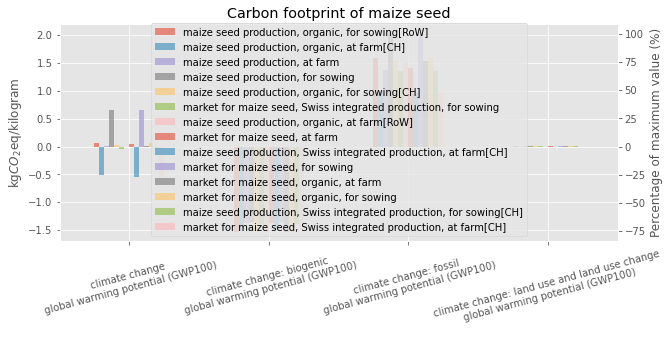

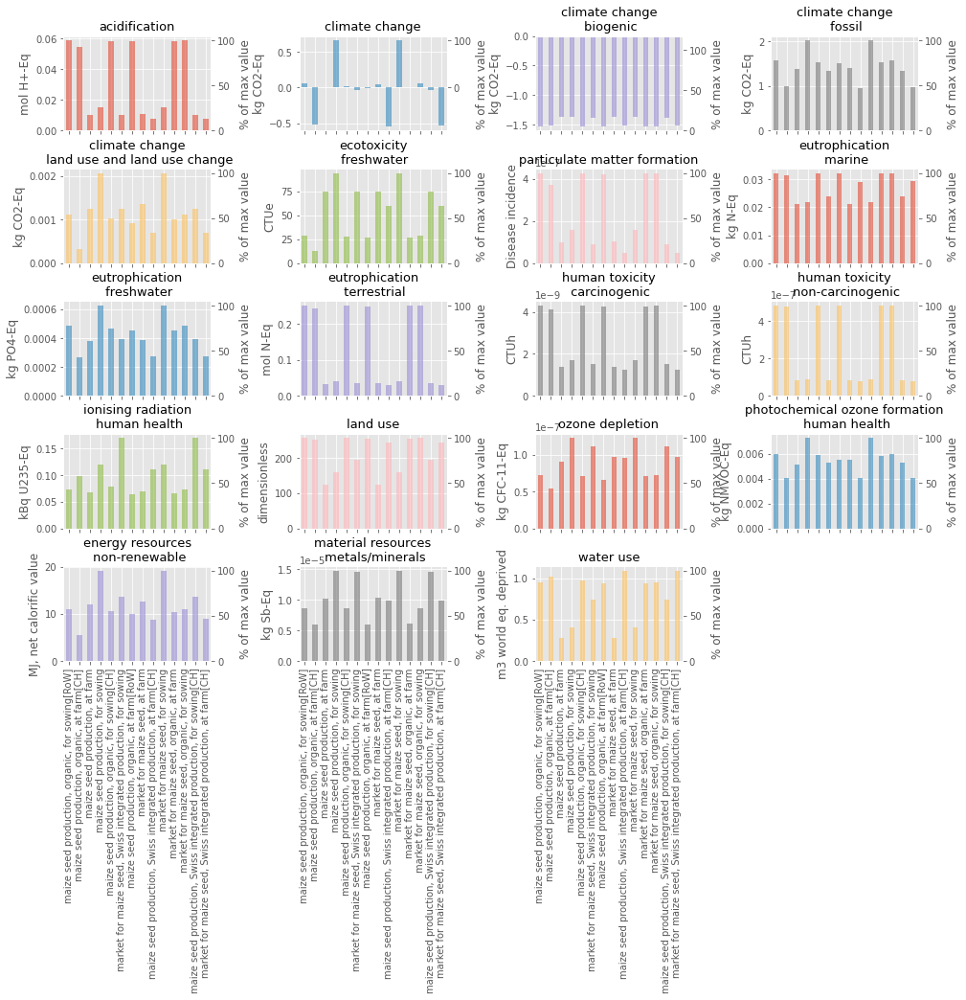

In [106]:
list_act.analyse(methods_CC, methods_EF, 3)

In [ ]:
fig, ax = plt.subplots()
df.loc[[idx for idx in df.index if 'inorganic potassium fertiliser, as K2O' in idx]].plot(kind = 'box',
                                                                                          showmeans = True, 
                                                                                          ax = ax)
ax.set_ylim([0,10])
display(df.loc[[idx for idx in df.index if 'inorganic potassium fertiliser, as K2O' in idx]].describe())

<AxesSubplot:>

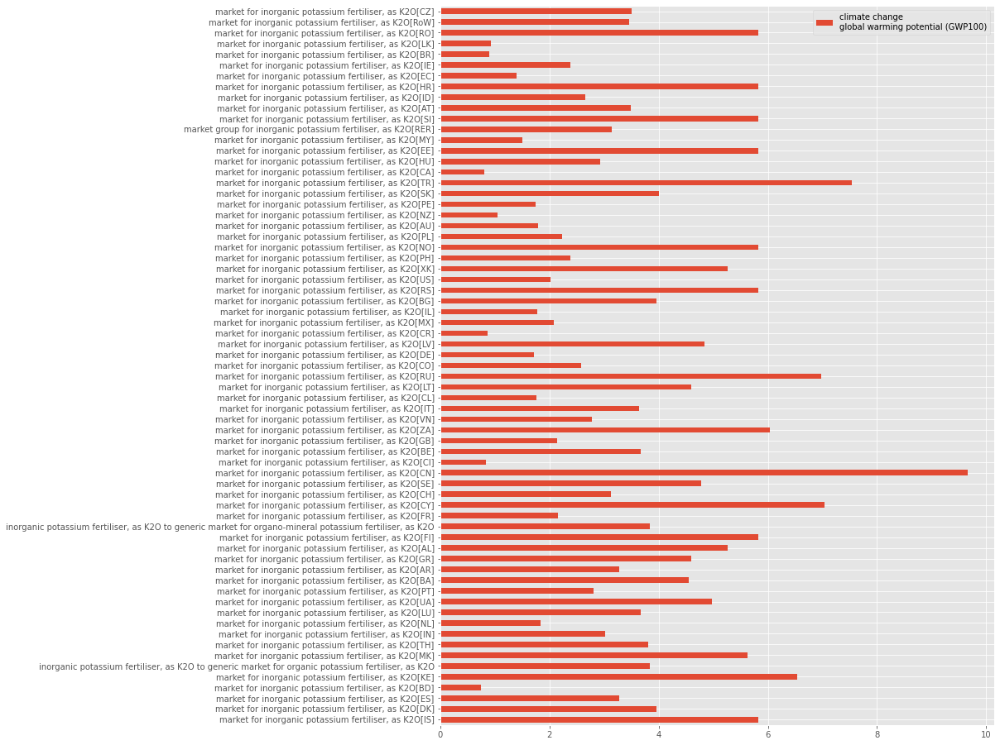

In [42]:
fig, ax = plt.subplots(figsize = (12, 16))
df.loc[[idx for idx in df.index if 'inorganic potassium fertiliser, as K2O' in idx]].plot(kind = 'barh',
                                                                                          ax = ax)

# Impact of fertiliser production and operation

In [177]:
list_name = [act['name'] for act in eidb if 'fertilis' in act['name'] and 'hectare' == act['unit']]
list_name

['fertilising, by stool splitter, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by stool splitter, sugarcane',
 'fertilising, by rig fertiliser, sugarcane',
 'market for fertilising, by stool splitter, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by broadcaster',
 'fertilising, by rig fertiliser, sugarcane',
 'fertilising, by broadcaster',
 'market for fertilising, by rig fertiliser, sugarcane',
 'fertilising, by broadcaster',
 'fertilising, by broadcaster',
 'market for planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter',
 'planting with starter fertiliser, by no till planter',
 'market for fertilising, by broadcaster']

In [178]:
len(eidb)

19565

In [179]:
list_act = []
for i, act in enumerate(eidb):
    if i%100 == 0:
        print(i)
    for exc in act.exchanges():
        if bw.get_activity(exc['input'])['name'] in list_name:
            print(act)
            list_act.append(act)

0
100
'barley production' (kilogram, DE, None)
'maize silage production' (kilogram, ZA, None)
200
300
'intensive beef cattle production, fat steers only, on pasture' (kilogram, BR, None)
'barley production' (kilogram, FR, None)
'sheep production, for meat' (kilogram, US, None)
400
'coffee green bean production, robusta' (kilogram, BR, None)
'potato production' (kilogram, IN, None)
500
'soybean production, Swiss integrated production, intensive' (kilogram, CH, None)
'beef cattle production on pasture' (kilogram, BR, None)
600
'alfalfa/grass silage production' (kilogram, CA-QC, None)
'barley production' (kilogram, ES, None)
700
'soybean production' (kilogram, CH, None)
'carrot production' (kilogram, NL, None)
'fertilising, by rig fertiliser, sugarcane' (hectare, RoW, None)
'fattening of heifers for beef cattle production, on pasture' (kilogram, RoW, None)
800
'apple production' (kilogram, RoW, None)
'miscanthus rhizome production, for planting' (unit, DE, None)
900
'soybean production' (

KeyboardInterrupt: 

In [184]:
list_act = dbex.list_act(database = eidb,
                         name = 'rape seed production',
                         unit = 'kilogram',
                         location = 'RoW'
                        )

list_act.explore(strict = False, 
                 comments = True)

['rape seed production, organic' (kilogram, RoW, None),
 'rape seed production, organic, for sowing' (kilogram, RoW, None),
 'rape seed production, for sowing' (kilogram, RoW, None),
 'rape seed production' (kilogram, RoW, None)]


List of names:


{'rape seed production',
 'rape seed production, for sowing',
 'rape seed production, organic',
 'rape seed production, organic, for sowing'}

List of locations:


{'RoW'}

List of units:


{'kilogram'}

'rape seed production, organic' (kilogram, RoW, None)


'This dataset represents the production of 1 kg of rape seed (fresh matter). The yield is 2023 kg/ha at a moisture content at storage of 6%.\n\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change rep



'rape seed production, organic, for sowing' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nRefers to 1 kg seed of rape seed (fresh weight), wi



'rape seed production, for sowing' (kilogram, RoW, None)


'Refers to 1 kg seed of rape seed (fresh weight), with a maximum water content of 6%\n[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made



'rape seed production' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThis dataset represents the production of 1 kg of r

Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'CORINE 211b' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'CORINE 231a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'CORINE x' : backing to amount
Error while parsing formula 'CORINE 121a' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'C5H13ClN+' : backing to amount
Error while parsing formula 'CORINE 21' : backing to amount
Error while parsing formula 'CORINE 211a' : backing to amount
Error while parsing formula 'NO3-' : backing to amount
Error while parsing formula 'Cu+' : backing to amount
C:\Users\romai\anaconda3\envs\python38\lib\site-packages\lca_algebraic\helpers.py:653: PerformanceWarning:

Da

rape seed production, organic[RoW] (1.000000 kilogram)  \
                                                                                              input   
Ammonia                                                                                 Ammonia       
Cadmium                                                                                 Cadmium       
Cadmium, ion                                                                                NaN       
Cadmium, ion#1                                                                              NaN       
Carbaryl                                                                                    NaN       
...                                                                                         ...       
tillage, harrowing, by spring tine harrow     market for tillage, harrowing, by spring tine ...       
tillage, ploughing                                                market for tillage, ploughing       
transport, tractor and trailer, agricultural  market for transport, tractor and trailer, agr...       
urea                                                                                        NaN       
urea#1                                                                                      NaN       

                                                                       \
                                                amount           unit   
Ammonia                                            H3N       kilogram   
Cadmium                                             Cd       kilogram   
Cadmium, ion                                       NaN            NaN   
Cadmium, ion#1                                     NaN            NaN   
Carbaryl                                           NaN            NaN   
...                                                ...            ...   
tillage, harrowing, by spring tine harrow     0.000989        hectare   
tillage, ploughing                            0.000494        hectare   
transport, tractor and trailer, agricultural    0.0005  ton kilometer   
urea                                               NaN            NaN   
urea#1                                             NaN            NaN   

                                             rape seed production, organic, for sowing[RoW] (1.000000 kilogram)  \
                                                                                                          input   
Ammonia                                                                                     NaN                   
Cadmium                                                                                     NaN                   
Cadmium, ion                                                                                NaN                   
Cadmium, ion#1                                                                              NaN                   
Carbaryl                                                                                    NaN                   
...                                                                                         ...                   
tillage, harrowing, by spring tine harrow                                                   NaN                   
tillage, ploughing                                                                          NaN                   
transport, tractor and trailer, agricultural                                                NaN                   
urea                                                                                        NaN                   
urea#1                                                                                      NaN                   

                                                          \
                                             amount unit   
Ammonia                                         NaN  NaN   
Cadmium                                         NaN  NaN   
Cadmium, ion       

All flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
market for sowing,0.000494,NaN,NaN,0.000341
"market for rape seed, organic, for sowing",0.002719,NaN,NaN,NaN
"rape seed production, organic",1.0,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",14.829,NaN,NaN,NaN
"market for tillage, ploughing",0.000494,NaN,NaN,0.000228
...,...,...,...,...
"Chromium, ion",NaN,NaN,NaN,0.000007
Napropamide,NaN,NaN,NaN,0.000055
Quizalofop-P,NaN,NaN,NaN,0.000001
Dimethachlor,NaN,NaN,NaN,0.000048


Technosphere flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
market for sowing,0.000494,NaN,NaN,0.000341
"market for rape seed, organic, for sowing",0.002719,NaN,NaN,NaN
"market for solid manure loading and spreading, by hydraulic loader and spreader",14.829,NaN,NaN,NaN
"market for tillage, ploughing",0.000494,NaN,NaN,0.000228
"market for transport, tractor and trailer, agricultural",0.0005,NaN,NaN,0.002907
market for combine harvesting,0.000494,NaN,NaN,0.000334
"market for drying of bread grain, seed and legumes",0.0681,NaN,NaN,0.009735
"market for liquid manure spreading, by vacuum tanker",0.009886,NaN,NaN,NaN
"market for tillage, currying, by weeder",0.000494,NaN,NaN,NaN
"market for tillage, harrowing, by spring tine harrow",0.000989,NaN,NaN,0.000497


Biosphere flows:


,"rape seed production, organic_RoW","rape seed production, organic, for sowing_RoW","rape seed production, for sowing_RoW",rape seed production_RoW
Zinc,0.000335,NaN,NaN,-0.000002
Water,0.136516,NaN,NaN,0.223433
Mercury,0.000001,NaN,NaN,-0.0
Cadmium,-0.000001,NaN,NaN,0.000001
Nickel,0.000011,NaN,NaN,0.000001
...,...,...,...,...
"Chromium, ion",NaN,NaN,NaN,0.000007
Napropamide,NaN,NaN,NaN,0.000055
Quizalofop-P,NaN,NaN,NaN,0.000001
Dimethachlor,NaN,NaN,NaN,0.000048


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
"rape seed production, organic[RoW]",-0.934832,-1.984564,1.049378,0.000354
"rape seed production, organic, for sowing[RoW]",-1.508934,-3.472514,1.962444,0.001136
"rape seed production, for sowing[RoW]",-1.418149,-3.255207,1.830402,0.006657
rape seed production[RoW],-0.967060,-1.982020,1.014255,0.000705


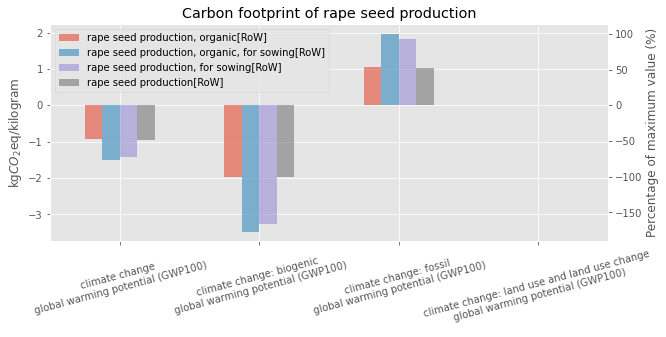

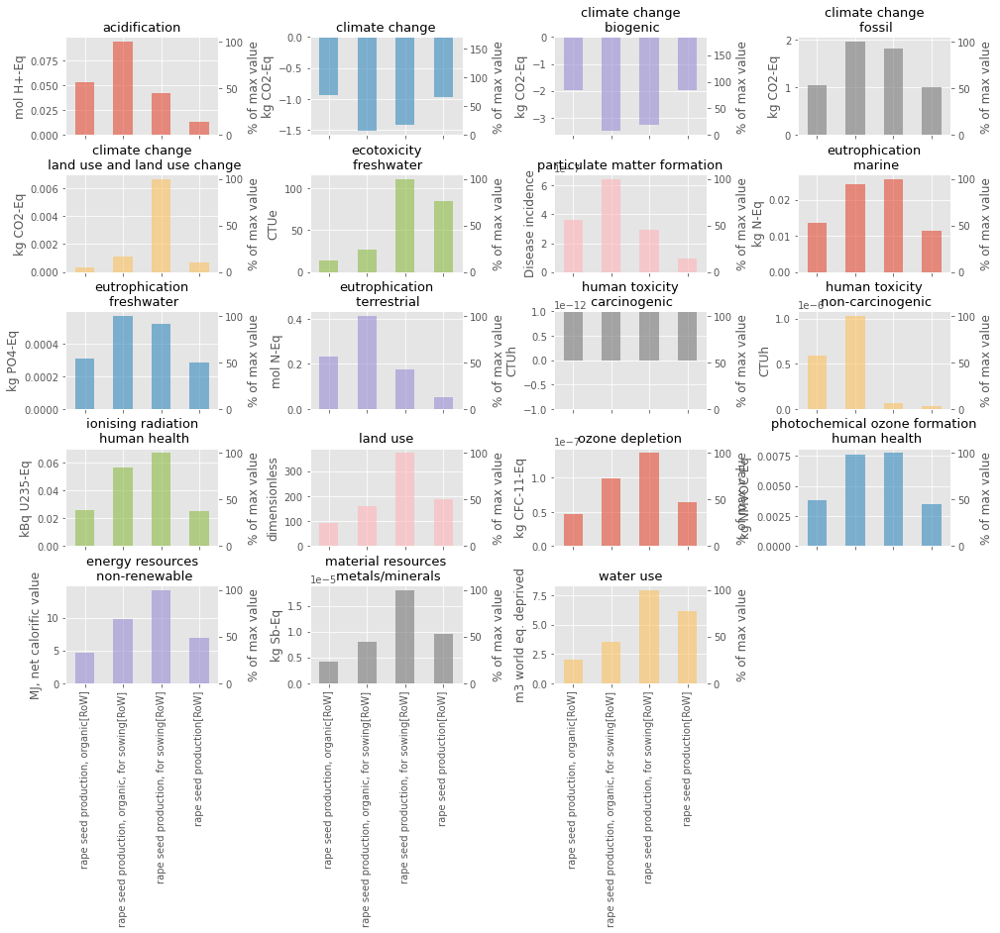

In [185]:
list_act.analyse(methods_CC = methods_CC, methods_EF = methods_EF, print_mode = 3)

In [1]:
1/0.000856

1168.2242990654206

Impact from both fertiliser and fertiliser operation

In [174]:
list_act = dbex.list_act(database = eidb,
                         name = 'ethanol production from sugar beet',
                         unit = 'kilogram',
                         location = 'RoW')

list_act.explore(strict = False, 
                 comments = True)

['ethanol production from sugar beet' (kilogram, RoW, None),
 'ethanol production from sugar beet molasses' (kilogram, RoW, None),
 'ethanol production from sugar beet' (kilogram, RoW, None)]


List of names:


{'ethanol production from sugar beet',
 'ethanol production from sugar beet molasses'}

List of locations:


{'RoW'}

List of units:


{'kilogram'}

'ethanol production from sugar beet' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThe multioutput-process "sugar beets, to fermentati



'ethanol production from sugar beet molasses' (kilogram, RoW, None)


"[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nInventory refers to the production of 1 kg hydrated



'ethanol production from sugar beet' (kilogram, RoW, None)


'[This dataset was already contained in the ecoinvent database version 2. It was not individually updated during the transfer to ecoinvent version 3. Life Cycle Impact Assessment results may still have changed, as they are affected by changes in the supply chain, i.e. in other datasets. This dataset was generated following the ecoinvent quality guidelines for version 2. It may have been subject to central changes described in the ecoinvent version 3 change report (http://www.ecoinvent.org/database/ecoinvent-version-3/reports-of-changes/), and the results of the central updates were reviewed extensively. The changes added e.g. consistent water flows and other information throughout the database. The documentation of this dataset can be found in the ecoinvent reports of version 2, which are still available via the ecoinvent website. The change report linked above covers all central changes that were made during the conversion process.]\nThe multioutput-process "sugar beets, to fermentati

ethanol production from sugar beet[RoW] (1.000000 kilogram)  \
                                                                                                        input   
Carbon dioxide, in air                                                                           NaN            
Carbon dioxide, non-fossil                                                Carbon dioxide, non-fossil            
Water                                                                                          Water            
Water#1                                                                                        Water            
Water, cooling, unspecified natural origin                Water, cooling, unspecified natural origin            
...                                                                                              ...            
tap water#6                                                                 market for tap water[ZA]            
tap water#7                                                                market for tap water[RoW]            
vinasse, from fermentation of sugar beet           vinasse, from fermentation of sugar beet, Recy...            
vinasse, from fermentation of sugar beet molasses                                                NaN            
wastewater, from residence                                                                       NaN            

                                                                          \
                                                     amount         unit   
Carbon dioxide, in air                                  NaN          NaN   
Carbon dioxide, non-fossil                              CO2     kilogram   
Water                                                   H2O  cubic meter   
Water#1                                                 H2O  cubic meter   
Water, cooling, unspecified natural origin              H2O  cubic meter   
...                                                     ...          ...   
tap water#6                                        0.000883     kilogram   
tap water#7                                        0.136589     kilogram   
vinasse, from fermentation of sugar beet          -1.655669     kilogram   
vinasse, from fermentation of sugar beet molasses       NaN          NaN   
wastewater, from residence                              NaN          NaN   

                                                  ethanol production from sugar beet molasses[RoW] (1.000000 kilogram)  \
                                                                                                                 input   
Carbon dioxide, in air                                                        Carbon dioxide, in air                     
Carbon dioxide, non-fossil                                                Carbon dioxide, non-fossil                     
Water                                                                                          Water                     
Water#1                                                                                          NaN                     
Water, cooling, unspecified natural origin                                                       NaN                     
...                                                                                              ...                     
tap water#6                                                                 market for tap water[ZA]                     
tap water#7                                                                market for tap water[RoW]                     
vinasse, from fermentation of sugar beet                                                         NaN                     
vinasse, from fermentation of sugar beet molasses  vinasse, from fermentation of sugar beet molas...                     
wastewater, from residence                                market for wastewater, from residence[RoW]                     

    

All flows:


,ethanol production from sugar beet_RoW,ethanol production from sugar beet molasses_RoW,ethanol production from sugar beet_RoW
market for ethanol fermentation plant,0.0,0.0,0.0
ethanol production from sugar beet,1.0,NaN,1.0
market for sodium phosphate,0.001598,NaN,0.003892
market for sulfuric acid,0.007993,0.037741,0.019473
"market for sodium sulfate, anhydrite",0.001065,NaN,0.002595
market for sugar beet,2.671425,NaN,6.507831
"vinasse, from fermentation of sugar beet, Recycled Content cut-off",-1.655669,NaN,-4.033359
"market for heat, district or industrial, natural gas",0.879727,12.654276,2.143094
market for tap water,0.25464,8.051276,0.620326
"market for electricity, medium voltage",0.002809,0.013219,0.006842


Carbon footprint:


,climate change\nglobal warming potential (GWP100),climate change: biogenic\nglobal warming potential (GWP100),climate change: fossil\nglobal warming potential (GWP100),climate change: land use and land use change\nglobal warming potential (GWP100)
ethanol production from sugar beet[RoW],-0.404344,-0.676564,0.271974,0.000246
ethanol production from sugar beet molasses[RoW],1.319291,0.308665,1.009903,0.000723
ethanol production from sugar beet[RoW]',-0.985019,-1.648171,0.662554,0.000599


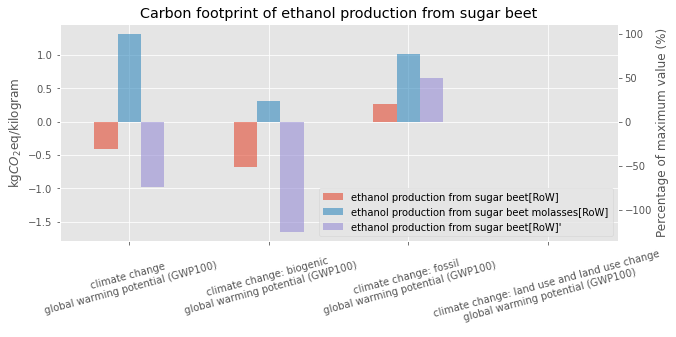

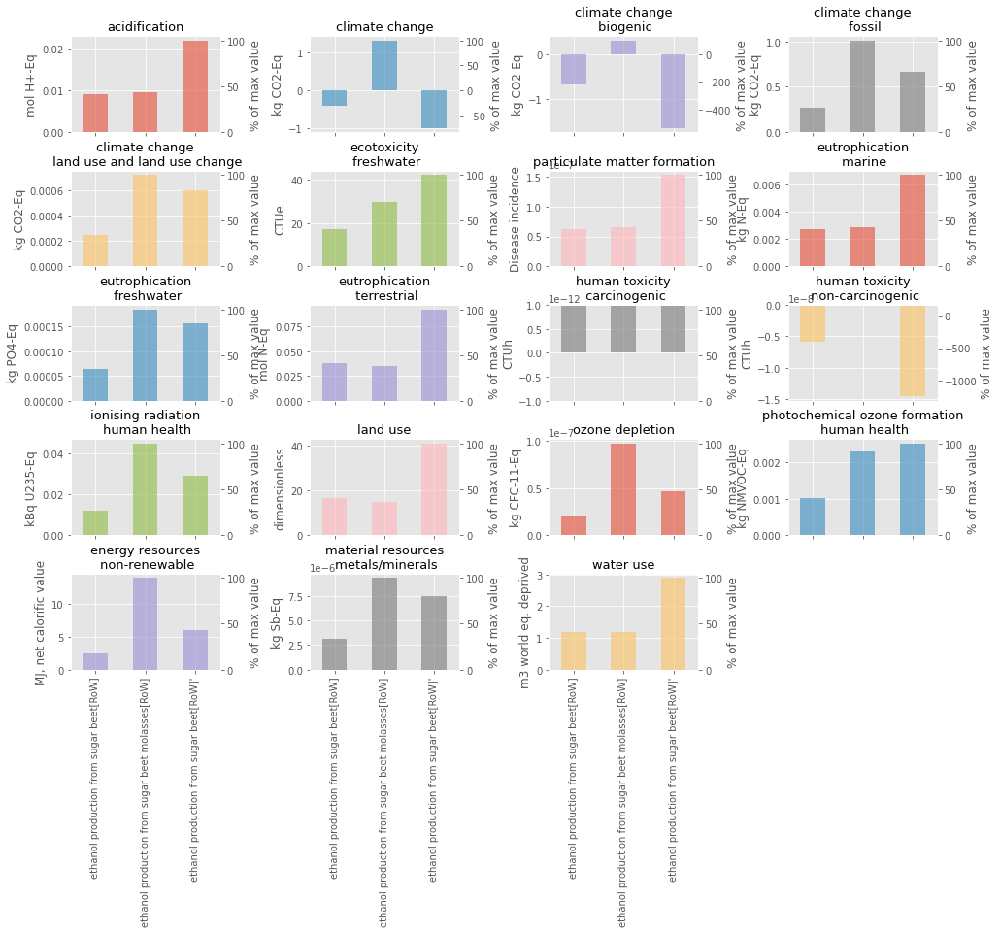

In [175]:
list_act.analyse(methods_CC, methods_EF, print_mode = 2)

# Calculation

In [17]:
df = pd.DataFrame(index = ['CO2', 'CH4', 'N2O'])
df['g/kg'] = [3876.50, 2.1654, 2.152]
df['gCO2eq/kg'] = df['g/kg'].multiply([1, 25, 298])
df['% CO2eq'] = df[['gCO2eq/kg']] / df[['gCO2eq/kg']].sum()
df

,g/kg,gCO2eq/kg,% CO2eq
CO2,3876.5000,3876.500,0.847891
CH4,2.1654,54.135,0.011841
N2O,2.1520,641.296,0.140268


<AxesSubplot:>

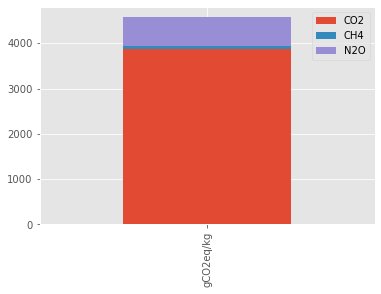

In [16]:
df[['gCO2eq/kg']].T.plot(kind = 'bar', stacked = True)

In [14]:
act = [act for act in eidb if 'market for NPK (15-15-15) fertiliser' in act['name']
 and 'RoW' in act['location']][0]
act

'market for NPK (15-15-15) fertiliser' (kilogram, RoW, None)

In [17]:
act = [act for act in eidb if 'NPK (15-15-15) fertiliser production' in act['name']
        and 'RoW' in act['location']][0]
act

'NPK (15-15-15) fertiliser production' (kilogram, RoW, None)

In [18]:
agb.printAct(act)

Error while parsing formula 'F-' : backing to amount


NPK (15-15-15) fertiliser production[RoW] (1.000000 kilogram)  \
                                                                                           input   
Ammonia                                                                       Ammonia              
Fluoride                                                                     Fluoride              
Fluorine                                                                     Fluorine              
Nitrogen                                                                     Nitrogen              
Particulates, > 2.5 um, and < 10um                 Particulates, > 2.5 um, and < 10um              
Phosphorus                                                                 Phosphorus              
Water                                                                           Water              
ammonium nitrate                                     market for ammonium nitrate[RoW]              
dolomite                                                     market for dolomite[RoW]              
electricity, low voltage                      market for electricity, low voltage[AU]              
electricity, low voltage#1                    market for electricity, low voltage[NZ]              
electricity, low voltage#2             market group for electricity, low voltage[RAF]              
electricity, low voltage#3             market group for electricity, low voltage[RLA]              
monoammonium phosphate                         market for monoammonium phosphate[RoW]              
potassium chloride                                 market for potassium chloride[RoW]              
steam, in chemical industry               market for steam, in chemical industry[RoW]              

                                                             
                                      amount           unit  
Ammonia                                  H3N       kilogram  
Fluoride                            0.000135       kilogram  
Fluorine                                  F2       kilogram  
Nitrogen                                  N2       kilogram  
Particulates, > 2.5 um, and < 10um   0.00015       kilogram  
Phosphorus                                 P       kilogram  
Water                                    H2O    cubic meter  
ammonium nitrate                       0.359       kilogram  
dolomite                               0.103       kilogram  
electricity, low voltage            0.002438  kilowatt hour  
electricity, low voltage#1          0.000444  kilowatt hour  
electricity, low voltage#2          0.007146  kilowatt hour  
electricity, low voltage#3           0.01775  kilowatt hour  
monoammonium phosphate                 0.288       kilogram  
potassium chloride                      0.25       kilogram  
steam, in chemical industry         0.109091       kilogram

In [23]:
methods_CED = [ m for m in bw.methods if 'cumulative energy demand' in str(m)]

In [28]:
bw.Method(methods_CED[0]).metadata

{'description': 'Characterisation with the upper heating value of the fossil energy resources extracted.',
 'filename': 'LCIA_Implementation_3.8.xlsx',
 'unit': 'MJ-Eq',
 'abbreviation': 'cumulative-energy-demandfn.87dea213a7ae4b1434d554f6c25cf4d0',
 'num_cfs': 6}

In [24]:
agb.multiLCA(act, methods_CED)

,"fossil - non-renewable energy resources, fossil","nuclear - non-renewable energy resources, nuclear","biomass - renewable energy resources, biomass","water - renewable energy resources, potential (in barrage water), converted","geothermal - renewable energy resources, geothermal, converted","solar - renewable energy resources, solar, converted","wind - renewable energy resources, kinetic (in wind), converted","primary forest - non-renewable energy resources, primary forest"
NPK (15-15-15) fertiliser production[RoW],14.004163,0.380418,0.281205,0.409759,0.01222,0.009649,0.066949,0.00368
